# Introduction into the WIDS Datathon 2025 data set

The data proposed for analysis in this competition was provided by the Healthy Brain Network (HBN), focusing on brain activity during the resting state. The brain is divided into regions of interest, and the average activity levels of each region over time is extracted. These data is used to create two-dimensional matrices, where each entry represents the correlation between two brain regions.

The HBN dataset includes approximately 1,578 people aged between 5 and 21 years, of whom 63% are male and 37% are female. Each individual has a functional connectivity network matrix (200x200) and additional information such as sex, ethnicity, race, etc.

The goal of this project is to help researchers develop and share models that predict age in male and female children and adolescents based on each person's brain activity patterns. By understanding how development occurs differently in male and female brains, researchers hope to improve the understanding of neuropsychiatric disorders that emerge during childhood and adolescence. A better understanding of these disorders could lead to early detection, particularly for at-risk girls, and to the creation of targeted treatments. The objective is to improve clinical interventions and provide better care for psychiatric disorders that often begin in childhood or adolescence.

### Data Science Skills Developed:

* Python Matrix Manipulation
* Understanding correlations
* Regression model selection (statistical, machine learning)
* Regression model fitting/testing (cross validation, avoiding over/underfitting, stratification of data during training)
* Explaining factors that drive the performance of the model

# I. Data Importing and Pre-processing

## 1. Importing the necessary libraries

In [311]:
import pandas as pd

import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold, StratifiedKFold, RandomizedSearchCV
from sklearn.svm import SVC
from sklearn.metrics import balanced_accuracy_score, roc_auc_score, accuracy_score, confusion_matrix, roc_curve
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import RidgeCV
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.cluster import KMeans

from scipy.stats import zscore, pearsonr, uniform
from scipy.io import loadmat
from scipy.stats import chi2_contingency, spearmanr
from scipy.cluster.hierarchy import dendrogram, linkage

from xgboost import XGBRegressor

# The following lines adjust the granularity of reporting.
pd.options.display.max_rows = 10
pd.options.display.float_format = "{:.1f}".format

## 2. Extracting the data from the connectivity matrices

Our folders, `test_tsv` and `train_tsv`, containing over a thousand files. Each file represents a correlation matrix for a single patient. These matrices are symmetric, meaning the values on both sides of the diagonal are identical, so we only need to extract the upper triangle portion of each matrix (the values above and excluding the diagonal).

To process the data, for each patient file, we will:

1. Extract the values from the **upper triangle of the correlation matrix**.
2. Line up these values in a row, representing the patient’s data as a vector of correlations.

After doing this for every file in the test_tsv and train_tsv folders, we will combine the resulting rows to form two larger matrices:

1. One dataframe for the test data, with 474 rows (one for each patient).
2. Another dataframe for the train data, with 1104 rows.

#### How the dataset is processed:

1) Extract a row of correlations from the Upper Triangular portion of the 2 dimensional, creating a vector of correlations for each individual.

2) Perform the above operation for the files in each of the two Training and Test folders - thereby creating Training and Test dataframes.  

3) Join Training and Test dataframes with respective metadata.

4) Now the dataset is ready for Machine Learning

5) Fit your favorite model.

The function below converts the square matrix into a long row of unique correlations.

Parameters:
        matrix (`pd.DataFrame` or `np.ndarray`): The square matrix to convert.

Returns:
        `pd.DataFrame`: A transposed dataframe where each entry is a unique correlation that we can later concatenate into final output dataframe.

In [312]:
def convert_matrix_to_long_row(matrix):

    # Ensure it's a DataFrame
    if isinstance(matrix, np.ndarray):
        matrix = pd.DataFrame(matrix)

    # Get upper triangle of the matrix (excluding the diagonal)
    upper_triangle = matrix.where(np.triu(np.ones(matrix.shape), k=1).astype(bool))

    # Drop NaN values and get unique values
    unique_correlations = upper_triangle.stack().dropna().unique()

    return pd.DataFrame(unique_correlations).T

The function below returns a list that will contain the names of our columns in the format i_throw_j_thcolumn, where i and j correspond to the row index and the column index, respectively, for each element above the main diagonal (excluding the diagonal).

In [313]:
def generate_column_headers(matrix):
    rows, cols = matrix.shape
    headers = [f'{i}throw_{j}thcolumn' for i in range(rows) for j in range(cols) if i < j]
    return headers

The function below checks, for each patient, the length of the patient's ID, extracts that ID from the file name, and adds it to the column named 'participant_id'. The function below will also create the data frame in which all variables derived from the connectivity matrices will be stored.

In [314]:
long_rows = []
all_headers = []

def process_folder(source_folder, output_file):
  long_rows = []
  # Iterate over items in the source folder

  for filename in os.listdir(source_folder):
      file_path = os.path.join(source_folder, filename)
      # print(filename)

      # edge cases: check if id is 12 bytes or 11
      len_id = 12 # default
      if filename[4:4+len_id][-1] == "_":
        print(filename[4:4+len_id])
        len_id = 11

      # Check if it is a file (and not a directory) and ends with .tsv
      if os.path.isfile(file_path) and filename.endswith('.tsv'):
          try:
              # Load the matrix
              matrix = pd.read_csv(file_path, sep='\t', header=None)

              # Generate column headers for this matrix
              headers = ['participant_id']+generate_column_headers(matrix)
              all_headers = headers  # Assume all files have the same matrix shape

              # Convert the matrix to a long row of unique correlations
              long_row = convert_matrix_to_long_row(matrix)

              # add patient ID
              extracted_id = filename[4:4+len_id]

              long_row.insert(0, "participant_id", extracted_id)

              # Append the long row as a new row in the results
              long_rows.append(long_row)

          except Exception as e:
              print(f"Error processing file {filename}: {e}")
      else:
          print(f"Skipping {filename} (not a file or not a TSV)")

  # need to write out the file
  out_df = pd.concat(long_rows)
  out_df.columns = headers
  out_df.to_csv(output_file, sep='\t', header=True)
  return out_df

Before we call our process folder function we need to define our source_folder and output_file

We need:
  
  
*   `source_folder` = Path to folder containing TSV files

*  `output_file` = Path to output TSV file


Once we define our source folder and output file for both our test and train data we need to call the process folder function twice
first with our test data and second with our train data

In [315]:
source_folder_test = 'C:/Data Science Projects/WIDS Datathon University Edition 2025/widsdatathon2025-university/test_tsv/test_tsv'
output_file_test = 'C:/Data Science Projects/WIDS Datathon University Edition 2025/widsdatathon2025-university/test_correlations.tsv'

source_folder_train = 'C:/Data Science Projects/WIDS Datathon University Edition 2025/widsdatathon2025-university/train_tsv/train_tsv'
output_file_train = 'C:/Data Science Projects/WIDS Datathon University Edition 2025/widsdatathon2025-university/train_correlations.tsv'

After defining our parameters we can call the process folder function:

In [316]:
# calling process folder function for test data
test_big = process_folder(source_folder_test, output_file_test)

In [317]:
# calling process folder for train data
train_big = process_folder(source_folder_train, output_file_train)

NDARJ257ZU2_
NDARVB04TJA_


In [318]:
# checking lengths of the train/test big dataframes to make sure there were no errors in uploads/processing

print("# rows, train: ", len(train_big))

print("# rows, test: ", len(test_big))

# rows, train:  1104
# rows, test:  474


Once we have built two data frames from our correlation matrices we have to read those files in. We also have metadata (excel files) that we are going to merge with our correlation matrices.

In [319]:
train_short = pd.read_csv("C:/Data Science Projects/WIDS Datathon University Edition 2025/widsdatathon2025-university/metadata/training_metadata.csv")
test_short = pd.read_csv("C:/Data Science Projects/WIDS Datathon University Edition 2025/widsdatathon2025-university/metadata/test_metadata.csv")

In [320]:
# Checking the size of our short datframes

print(train_short.shape)

print(test_short.shape)

(1104, 14)
(474, 13)


We will be using pandas merge function to combine our correlation dataframes with our metadata.

The `pd.merge()` function combines two DataFrames based on a common column (`participant_id`), aligning rows with matching values and allowing you to specify to keep all rows from both (`outer`).

In [321]:
train = pd.merge(train_big, train_short, on='participant_id', how='outer')

test = pd.merge(test_big, test_short, on='participant_id', how='outer')

In [322]:
# print the first few rows of dataframe
print(train.head())
print(test.head())

# print the shape of dataframe
print(train.shape)
print(test.shape)

  participant_id  0throw_1thcolumn  0throw_2thcolumn  0throw_3thcolumn  \
0   NDARAA306NT2               0.5               0.5               0.4   
1   NDARAA504CRN               0.1               0.7               0.7   
2   NDARAA536PTU               0.1               0.5               0.3   
3   NDARAB055BPR               0.3               0.6               0.1   
4   NDARAB458VK9               0.3               0.6               0.7   

   0throw_4thcolumn  0throw_5thcolumn  0throw_6thcolumn  0throw_7thcolumn  \
0               0.4               0.7               0.4               0.5   
1               0.5               0.7               0.6               0.5   
2               0.7               0.7               0.6               0.5   
3               0.2               0.5               0.5               0.7   
4               0.5               0.7               0.7               0.5   

   0throw_8thcolumn  0throw_9thcolumn  ...  bmi               ethnicity  \
0              -0

In [323]:
#Check for NaN in the test dataframe
print("NaN values in train:", pd.isna(train).sum().sum())

#Check for NaN in the train dataframe
print("NaN values in test:", pd.isna(test).sum().sum())

NaN values in train: 1688
NaN values in test: 230


# II. Exploratory Data Analysis

## 1. Descriptive Statistics


Next, we will proceed with a descriptive analysis of the data. The purpose of this section is to gain a better understanding of our variables, the correlations between them, and especially the relationships between the `age` variable and the rest of the variables.

In [324]:
train[['age','bmi','p_factor_fs','internalizing_fs','externalizing_fs','attention_fs']].describe().T

,count,mean,std,min,25%,50%,75%,max
age,1104.0,11.2,3.2,5.0,8.7,10.6,13.5,21.9
bmi,1086.0,19.8,5.0,12.6,16.3,18.6,22.2,46.1
p_factor_fs,1104.0,0.2,1.0,-1.6,-0.5,0.2,1.0,3.0
internalizing_fs,1104.0,0.1,1.0,-2.3,-0.7,0.1,0.9,2.8
externalizing_fs,1104.0,0.1,1.1,-2.1,-0.6,-0.2,0.6,4.2
attention_fs,1104.0,0.1,1.0,-3.2,-0.6,0.1,0.9,2.5


From the descriptive statistics for our quantitative variables, we can observe the following:

* The `age` variable has a mean of 11.2 years and a median value of 10.6 years.

* The `bmi` variable deviates the most from the mean, having the highest standard deviation.

* The `p_factor_fs` variable has a mean value of 0.2, close to 0 but a large standard deviation of 1.0, indicating that psychological difficulties vary significantly among participants.

* The `internalizing_fs` variable has a mean of 0.1, suggesting that most patients experience minor difficulties related to emotional dysfunction.

* The `externalizing_fs` variable, like the two variables above, has a high standard deviation relative to its scale, suggesting variability among patients in terms of aggression and behavioral problems.

* The `attention_fs` variable reflects issues related to attention deficit, hyperactivity, and impulsivity, and, similar to the previous variables, has a high standard deviation compared to its measurement scale.

In [325]:
variables = ['age', 'bmi', 'p_factor_fs', 'internalizing_fs', 'externalizing_fs', 'attention_fs']

cv_values = {}

for var in variables:
    mean = train[var].mean()
    std_dev = train[var].std()
    cv = (std_dev / mean)
    cv_values[var] = cv

for variable, cv in cv_values.items():
    print(f"{variable}: {cv}")

age: 0.28907528545395444
bmi: 0.24986040068433815
p_factor_fs: 4.5855985855497945
internalizing_fs: 9.847992492584051
externalizing_fs: 11.287204079768712
attention_fs: 12.569685099794915


Interpretation of the coefficient of variation for the given variables:

* The variables `age` and `bmi` have a coefficient of variation below 30%, suggesting that these variables are homogeneous.

* The variables `p_factor_fs`, `internalizing_fs`, `externalizing_fs`, and `attention_fs` all have a coefficient of variation above 100%, indicating a lack of homogeneity and very high variability in the data.

In [326]:
train[['sex', 'ethnicity', 'race','handedness', 'parent_1_education', 'parent_2_education',]].describe(include="all").T

,count,unique,top,freq
sex,1104,2,Male,688
ethnicity,995,2,Not_Hispanic_or_Latino,712
race,936,4,White,530
handedness,1104,3,Right,954
parent_1_education,921,4,Complete_tertiary,562
parent_2_education,1082,4,Complete_tertiary,806


In [327]:
train['handedness'].value_counts()

handedness
Right           954
Left            121
Ambidextrous     29
Name: count, dtype: int64

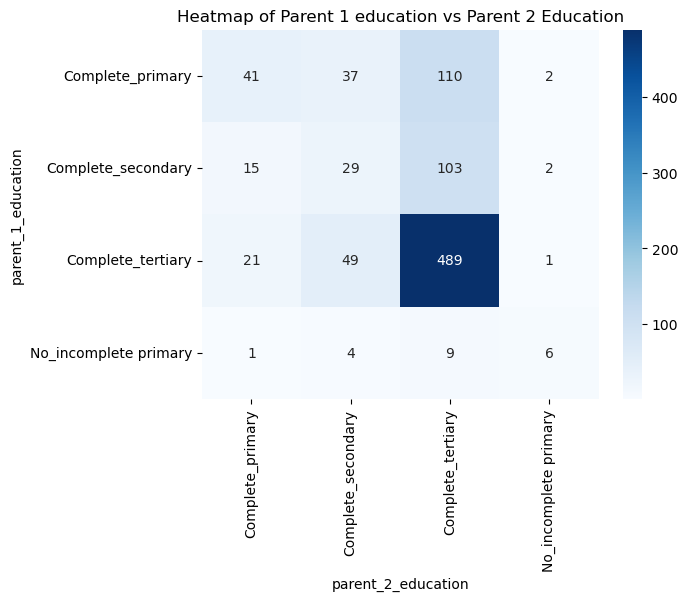

In [328]:
cross_tab = pd.crosstab(train['parent_1_education'], train['parent_2_education'])

sns.heatmap(cross_tab, annot=True, cmap='Blues', fmt='d')
plt.title('Heatmap of Parent 1 education vs Parent 2 Education')
plt.show()

From the heat map above, which illustrates the relationship between response categories for a categorical variable, we observe that the majority of patients come from families in which both parents have a higher level of education.

## 2. Data Visualization

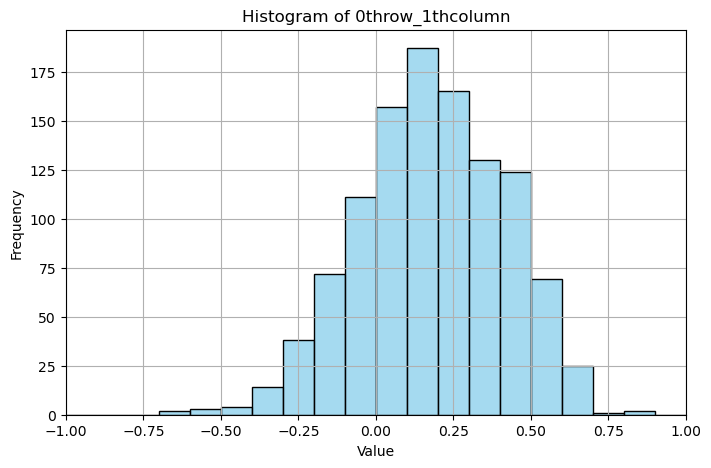

In [329]:
plt.figure(figsize=(8, 5))
sns.histplot(
    train['0throw_1thcolumn'],
    bins=20,
    binrange=(-1, 1),
    kde=False,
    color='skyblue'
)
plt.title('Histogram of 0throw_1thcolumn')
plt.xlabel('Value')
plt.ylabel('Frequency')

plt.xlim(-1, 1)

plt.grid(True)
plt.show()

For brain regions 1 and 0, we observe that most patients exhibit a weak but positive correlation.

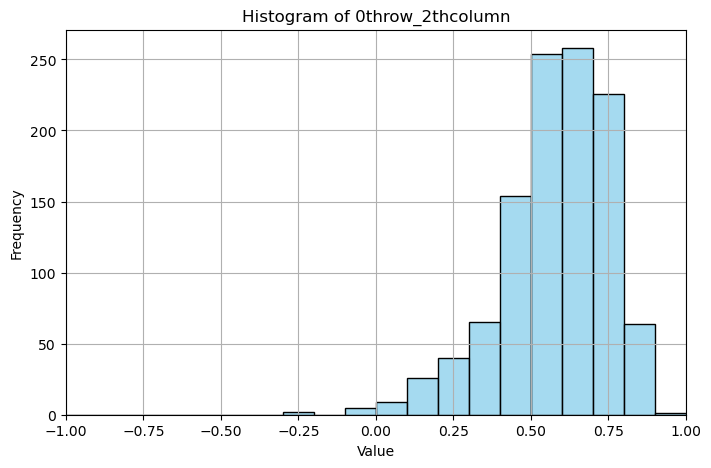

In [330]:
plt.figure(figsize=(8, 5))
sns.histplot(
    train['0throw_2thcolumn'],
    bins=20,
    binrange=(-1, 1),
    kde=False,
    color='skyblue'
)
plt.title('Histogram of 0throw_2thcolumn')
plt.xlabel('Value')
plt.ylabel('Frequency')


plt.xlim(-1, 1)

plt.grid(True)
plt.show()

For brain regions 0 and 2, we observe that most patients exhibit a moderately to strongly positive correlation.

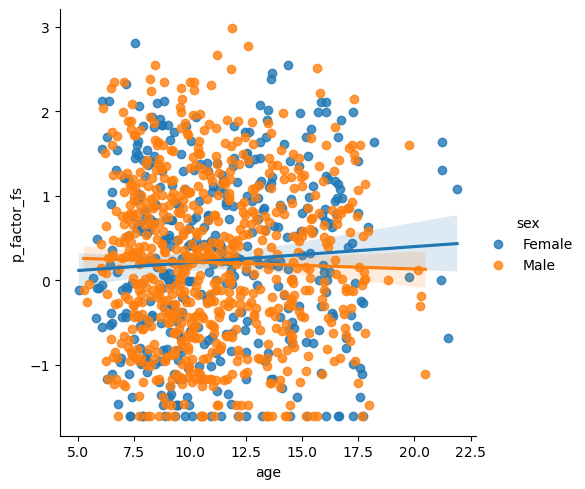

In [331]:
sns.lmplot(x="age", y="p_factor_fs", hue="sex", data=train)

We observe from the graph above that the trend lines by sex tend to evolve in opposite directions over time.

# III. Dimensionality Reduction on Train and Test Data

## 1. Imputations for Connectivity Matrix Data

To impute the missing values from the correlation matrices, we will store the names of these variables in the list `numeric_cols`, excluding the patients’ personal numerical variables such as `bmi`, `age`, etc.

In [332]:
# Select only the numerical columns obtained from the connectivity matrices
numeric_cols = train.select_dtypes(include=[np.number]).columns

# Remove all numerical columns that are not derived from the connectivity matrices, as we want to analyze them separately
excluded_cols = ['age', 'bmi','p_factor_fs','internalizing_fs','externalizing_fs','attention_fs']

# Use the difference method on the Index
numeric_cols = numeric_cols.difference(excluded_cols)

We will impute the missing values from the correlation matrices using the mean of the mri data grouped by sex and age groups. For this, we will create a new variable called `age_group`

Next, we created a histogram of the variable `age` in order to visualize its distribution. This helped us define a new variable called `age_group`.

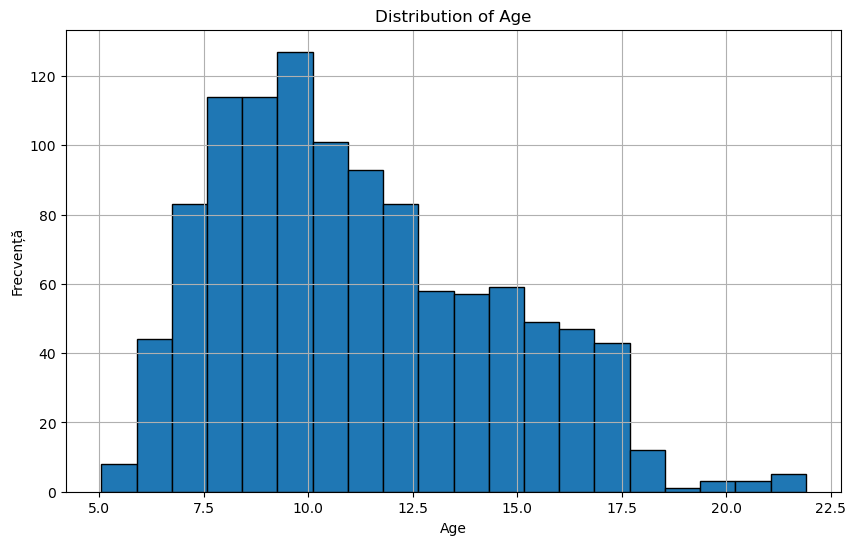

In [333]:
plt.figure(figsize=(10, 6))
plt.hist(train['age'], bins=20, edgecolor='black')
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Frecvență')
plt.grid(True)
plt.show()

We observe that the '`age`' variable ranges from 5 years to just under 22.5 years. To accurately define the lower and upper bounds of the intervals for the new '`age_group`' variable we aim to create, we will examine the minimum and maximum values of the '`age`' variable.

In [334]:
max_value = train['age'].max()
print(f"Maximum value of age: {max_value}")

min_value = train['age'].min()
print(f"Minimum value of age: {min_value}")

Maximum value of age: 21.9
Minimum value of age: 5.05


In [335]:
# Defining age range bins (interval edges)
bins = [5, 10, 15, 18, 22]

# Labels for the age groups
labels = ['5-10', '11-15', '16-18', '19-22']

# Creating the new column 'age_group'
train['age_group'] = pd.cut(train['age'], bins=bins, labels=labels, right=True)

# Displaying the new column
print(train[['age', 'age_group']].head())

   age age_group
0 21.2     19-22
1  9.2      5-10
2 12.0     11-15
3 10.8     11-15
4 12.8     11-15


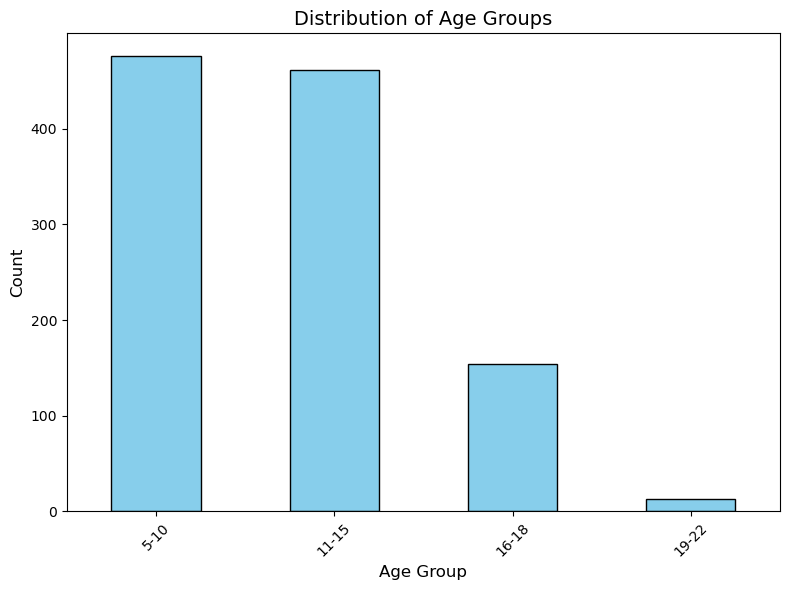

In [336]:
age_group_counts = train['age_group'].value_counts()

plt.figure(figsize=(8, 6))
age_group_counts.plot(kind='bar', color='skyblue', edgecolor='black')

plt.title('Distribution of Age Groups', fontsize=14)
plt.xlabel('Age Group', fontsize=12)
plt.ylabel('Count', fontsize=12)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

After creating the `age_group` variable, we can proceed with imputing the missing values using the mean grouped by sex and age groups. We considered these two variables relevant, as they are the only variabiles that can influence the biological structure of the human brain.

In [337]:
# Grouping the data by 'sex' and 'age_group'
grouped = train.groupby(['sex', 'age_group'])

# Imputing missing values for each variable in 'numeric_cols'
for col in numeric_cols:
    # Calculate the mean for each group
    train[col] = train.groupby(['sex', 'age_group'])[col].transform(lambda x: x.fillna(x.mean()))

# Check the first few rows to see the result
print(train[numeric_cols].head())

C:\Users\Francisca\AppData\Local\Temp\ipykernel_13520\192133154.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = train.groupby(['sex', 'age_group'])
C:\Users\Francisca\AppData\Local\Temp\ipykernel_13520\192133154.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  train[col] = train.groupby(['sex', 'age_group'])[col].transform(lambda x: x.fillna(x.mean()))
C:\Users\Francisca\AppData\Local\Temp\ipykernel_13520\192133154.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observ

   0throw_100thcolumn  0throw_101thcolumn  0throw_102thcolumn  \
0                 0.8                 0.6                 0.5   
1                 0.8                -0.0                 0.7   
2                 0.7                 0.5                 0.4   
3                 0.6                 0.5                 0.3   
4                 0.8                 0.3                 0.6   

   0throw_103thcolumn  0throw_104thcolumn  0throw_105thcolumn  \
0                 0.3                 0.4                 0.7   
1                 0.3                 0.6                 0.7   
2                 0.2                 0.6                 0.6   
3                 0.0                 0.6                 0.5   
4                 0.5                 0.3                 0.7   

   0throw_106thcolumn  0throw_107thcolumn  0throw_108thcolumn  \
0                 0.6                 0.1                 0.3   
1                 0.6                 0.1                 0.6   
2                 0.5  

The following three plots are heatmaps generated from the correlation matrices, each covering 1,000 variables. The first heatmap illustrates the correlations among the first 1,000 variables, the second includes variables from positions 1001 to 2000, and the third shows the correlations for variables between positions 2001 and 3000. These plots provide a clear view of the relationships between variables, grouped in sets of 1,000.

## 2. Clustering based on brain activity correlations

In [ ]:
df_selected = train.iloc[:, 1:1000]

plt.figure(figsize=(90, 90))
sns.heatmap(df_selected.corr(), annot=False, cmap="coolwarm", cbar=True)

plt.show()

In [ ]:
df_selected = train.iloc[:, 1001:2000]

plt.figure(figsize=(90, 90))
sns.heatmap(df_selected.corr(), annot=False, cmap="coolwarm", cbar=True)

plt.show()

In [ ]:
df_selected = train.iloc[:, 2001:3000]

plt.figure(figsize=(90, 90))
sns.heatmap(df_selected.corr(), annot=False, cmap="coolwarm", cbar=True)

plt.show()

In all three heatmaps, well-defined areas of strong correlations between variables can be observed. These resaults suggest that areas of the brain that are in proximity of each other also tend to be highly correlated in termns of brain activity.

Next, we aim to apply a clustering algorithm of the variables, taking into account the correlations between them, by computing correlation matrices for groups of 1,000 variables each.

The code below selects all variables derived from the correlation matrices, whose names are stored in the `numeric_cols` list, in order to identify clusters of highly correlated variables using hierarchical clustering based on distances.

The data is selected in groups of 1000, with each subset used to compute a correlation matrix of brain activity.

This matrix is then transformed into a distance matrix, where smaller distances correspond to stronger correlations. Hierarchical clustering is applied to the distance matrix using average linkage.

The clustering results are saved in a DataFrame called `final_results`, which associates each numeric variable with its corresponding cluster.

In [338]:
def process_subgroup(df_subset, distance_threshold=0.3):
    """
    Processes a subset of data to identify clusters based on correlation.
    Only works with numeric variables.
    """
    # Calculate the correlation matrix
    corr_matrix = df_subset.corr()

    # Transform the correlation matrix into a distance matrix
    distance_matrix = 1 - np.abs(corr_matrix)

    # Apply clustering on the distance matrix
    clustering = AgglomerativeClustering(
        metric="precomputed",  # Use 'metric' instead of 'affinity'
        linkage="average",
        distance_threshold=distance_threshold,
        n_clusters=None
    )
    labels = clustering.fit_predict(distance_matrix)

    # Return variables and their clusters
    return pd.DataFrame({"Variable": df_subset.columns, "Cluster": labels})

# Parameters
chunk_size = 1000  # Size of subsets (e.g., 1000 variables per batch)
distance_threshold = 0.3  # Distance threshold for defining clusters
results = []

# Use only the variables in numeric_cols

train_numeric = train[numeric_cols]  # Filter only the columns in numeric_cols

# Process data in chunks
for i in range(0, len(numeric_cols), chunk_size):
    print(f"Processing variables {i} - {i + chunk_size}...")
    # Select a subset of variables
    subset_cols = numeric_cols[i:i + chunk_size]
    df_subset = train_numeric[subset_cols]  # Extract the subset of variables

    # Process the subset to find clusters
    subset_results = process_subgroup(df_subset, distance_threshold)
    results.append(subset_results)

# Aggregate results from all subsets
final_results = pd.concat(results, ignore_index=True)

print("Cluster assignments stored in memory.")


Processing variables 0 - 1000...
Processing variables 1000 - 2000...
Processing variables 2000 - 3000...
Processing variables 3000 - 4000...
Processing variables 4000 - 5000...
Processing variables 5000 - 6000...
Processing variables 6000 - 7000...
Processing variables 7000 - 8000...
Processing variables 8000 - 9000...
Processing variables 9000 - 10000...
Processing variables 10000 - 11000...
Processing variables 11000 - 12000...
Processing variables 12000 - 13000...
Processing variables 13000 - 14000...
Processing variables 14000 - 15000...
Processing variables 15000 - 16000...
Processing variables 16000 - 17000...
Processing variables 17000 - 18000...
Processing variables 18000 - 19000...
Processing variables 19000 - 20000...
Cluster assignments stored in memory.


In [ ]:
final_results

As we can see below, each variable has been assigned to a cluster, resulting in total to 927 clusters

In [339]:
final_results['Cluster'].value_counts()

Cluster
12     49
3      48
34     48
10     47
15     47
       ..
922     2
919     2
925     1
924     1
926     1
Name: count, Length: 927, dtype: int64

We also observe that the number of variables included in each cluster is uneven, ranging from 51 variables in cluster 20 to a single variable in cluster 926.

Next, we will apply a principal component analysis (PCA) to each cluster, first testing this method on the variables included in Cluster 1.

In [340]:
count_cluster_1 = (final_results['Cluster'] == 1).sum()
print(f"Number of variables in Cluster 1: {count_cluster_1}")

Number of variables in Cluster 1: 43


Variables in Cluster=1: 43 variables identified.
Shape of the selected train subset: (1104, 43)


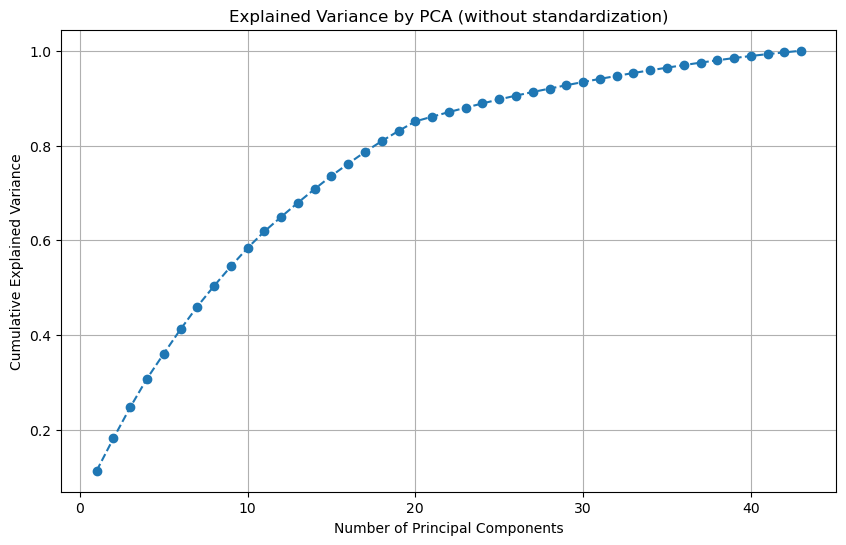

In [341]:
# Identifying variables from Cluster 1
cluster_1_variables = final_results[final_results['Cluster'] == 1]['Variable'].tolist()
print(f"Variables in Cluster=1: {len(cluster_1_variables)} variables identified.")

# Selecting variables from the train set
train_cluster_1 = train[cluster_1_variables]
print(f"Shape of the selected train subset: {train_cluster_1.shape}")

# Applying PCA to the selected subset (without standardization)
pca = PCA()
train_cluster_1_pca = pca.fit_transform(train_cluster_1)

# Visualizing the variance explained by the principal components
explained_variance = pca.explained_variance_ratio_
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance.cumsum(), marker='o', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by PCA (without standardization)')
plt.grid()
plt.show()

In [342]:
# Calculating the number of components for 80% explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

# Determine the number of components for which the cumulative explained variance exceeds 80%
n_components = np.argmax(cumulative_variance >= 0.80) + 1
print(f"Number of components needed for 80% explained variance: {n_components}")

# Selecting the first n principal components
pca_reduced = train_cluster_1_pca[:, :n_components]

# Creating the DataFrame with the principal components
# Column names: PC1_1, PC1_2, ..., PC1_n
columns = [f"PC1_{i+1}" for i in range(n_components)]
train_PCA_1 = pd.DataFrame(pca_reduced, columns=columns)

# Add the original index for reference
train_PCA_1.index = train.index
print(f"Shape of the resulting DataFrame after PCA: {train_PCA_1.shape}")

Number of components needed for 80% explained variance: 18
Shape of the resulting DataFrame after PCA: (1104, 18)


From the outputs above, we observe that for Cluster 1, we managed to reduce the dimensionality from 44 variables to 18 variables in order to reach the threshold of 80% of the total explained variance.

Below, we display a DataFrame containing all the generated principal components.

In [ ]:
train_PCA_1

In [343]:
unique_clusters = final_results['Cluster'].nunique()
print(f"Number of unique values in the column named 'Cluster': {unique_clusters}")

Number of unique values in the column named 'Cluster': 927


## 3. Principal Component Analysis at CLuster Level

Since PCA has proven to be an effective method for dimensionality reduction at the cluster level, we will apply it iteratively to all 927 clusters obtained.

In [344]:
# DataFrame to store all principal components
train_PCA = pd.DataFrame(index=train.index)

# Get the list of unique cluster values
unique_clusters = final_results['Cluster'].unique()
print(f"Total number of clusters: {len(unique_clusters)}")

# Iterate through each cluster
for cluster in unique_clusters:
    print(f"Processing Cluster = {cluster}...")

    # Identify variables for the current cluster
    cluster_variables = final_results[final_results['Cluster'] == cluster]['Variable'].tolist()
    print(f"Cluster {cluster}: {len(cluster_variables)} variables identified.")

    # Select variables from the train set
    train_cluster = train[cluster_variables]
    print(f"Shape of the selected subset for Cluster {cluster}: {train_cluster.shape}")

    # Apply PCA (without standardization)
    pca = PCA()
    train_cluster_pca = pca.fit_transform(train_cluster)

    # Calculate the number of components for 80% explained variance
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = explained_variance.cumsum()

    # Determine the number of components for which cumulative explained variance exceeds 80%
    n_components = np.argmax(cumulative_variance >= 0.80) + 1
    print(f"Cluster {cluster}: Number of components for 80% explained variance: {n_components}")

    # Select the first n principal components
    pca_reduced = train_cluster_pca[:, :n_components]

    # Create a DataFrame with the principal components
    # Column names: PCi_1, PCi_2, ..., PCi_n (where i = cluster number)
    columns = [f"PC{cluster}_{i+1}" for i in range(n_components)]
    cluster_PCA = pd.DataFrame(pca_reduced, columns=columns, index=train.index)

    # Add the principal components for the current cluster to train_PCA
    train_PCA = pd.concat([train_PCA, cluster_PCA], axis=1)

print(f"Final shape of the train_PCA DataFrame: {train_PCA.shape}")

Total number of clusters: 927
Processing Cluster = 699...
Cluster 699: 20 variables identified.
Shape of the selected subset for Cluster 699: (1104, 20)
Cluster 699: Number of components for 80% explained variance: 14
Processing Cluster = 294...
Cluster 294: 21 variables identified.
Shape of the selected subset for Cluster 294: (1104, 21)
Cluster 294: Number of components for 80% explained variance: 15
Processing Cluster = 189...
Cluster 189: 26 variables identified.
Shape of the selected subset for Cluster 189: (1104, 26)
Cluster 189: Number of components for 80% explained variance: 14
Processing Cluster = 92...
Cluster 92: 35 variables identified.
Shape of the selected subset for Cluster 92: (1104, 35)
Cluster 92: Number of components for 80% explained variance: 15
Processing Cluster = 61...
Cluster 61: 37 variables identified.
Shape of the selected subset for Cluster 61: (1104, 37)
Cluster 61: Number of components for 80% explained variance: 16
Processing Cluster = 5...
Cluster 5: 4

In [345]:
train_PCA.shape

(1104, 12469)

We can see that the number of variables has been significantly reduced—from 19.900 variables to 12.466 principal components, an improvement but not yet sufficient to apply a predictive model.

Next, we will rerun the same algorithm with the following adjustments:

We will exclude variables from clusters where the number of principal components required to reach 80% of the total explained variance exceeds 60% of the number of variables in that cluster. (For example, if Cluster 2 contains 100 variables and more than 60 principal components are needed to reach the 80% threshold, we will discard all variables from that cluster and move on to the next.)

We will also exclude variables that belong to clusters with fewer than 10 variables, as the cluster size is too small to apply PCA effectively.

In [346]:
# DataFrame to store all principal components
train_PCA = pd.DataFrame(index=train.index)

# Get the list of unique cluster values
unique_clusters = final_results['Cluster'].unique()
print(f"Total number of clusters: {len(unique_clusters)}")

# Iterate through each cluster
for cluster in unique_clusters:
    print(f"\nProcessing Cluster = {cluster}...")

    # Identify variables for the current cluster
    cluster_variables = final_results[final_results['Cluster'] == cluster]['Variable'].tolist()
    num_variables = len(cluster_variables)

    # Skip clusters with fewer than 10 variables
    if num_variables < 10:
        print(f"Cluster {cluster}: Skipped because it has only {num_variables} variables.")
        continue

    print(f"Cluster {cluster}: {num_variables} variables identified.")

    # Select variables from the train set
    train_cluster = train[cluster_variables]
    print(f"Shape of the selected subset for Cluster {cluster}: {train_cluster.shape}")

    # Apply PCA (without standardization)
    pca = PCA()
    train_cluster_pca = pca.fit_transform(train_cluster)

    # Calculate the number of components for 80% explained variance
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = explained_variance.cumsum()

    # Determine the number of components for which cumulative explained variance exceeds 80%
    n_components = np.argmax(cumulative_variance >= 0.80) + 1
    print(f"Cluster {cluster}: Number of components for 80% explained variance: {n_components}")

    # Check if the number of principal components exceeds 60% of the number of variables
    if n_components > 0.6 * num_variables:
        print(f"Cluster {cluster}: Skipped because the number of components ({n_components}) exceeds 60% of the number of variables ({num_variables}).")
        continue

    # Select the first n principal components
    pca_reduced = train_cluster_pca[:, :n_components]

    # Create a DataFrame with the principal components
    # Column names: PCi_1, PCi_2, ..., PCi_n (where i = cluster number)
    columns = [f"PC{cluster}_{i+1}" for i in range(n_components)]
    cluster_PCA = pd.DataFrame(pca_reduced, columns=columns, index=train.index)

    # Add the principal components for the current cluster to train_PCA
    train_PCA = pd.concat([train_PCA, cluster_PCA], axis=1)

print(f"\nFinal shape of the train_PCA DataFrame: {train_PCA.shape}")

Total number of clusters: 927

Processing Cluster = 699...
Cluster 699: 20 variables identified.
Shape of the selected subset for Cluster 699: (1104, 20)
Cluster 699: Number of components for 80% explained variance: 14
Cluster 699: Skipped because the number of components (14) exceeds 60% of the number of variables (20).

Processing Cluster = 294...
Cluster 294: 21 variables identified.
Shape of the selected subset for Cluster 294: (1104, 21)
Cluster 294: Number of components for 80% explained variance: 15
Cluster 294: Skipped because the number of components (15) exceeds 60% of the number of variables (21).

Processing Cluster = 189...
Cluster 189: 26 variables identified.
Shape of the selected subset for Cluster 189: (1104, 26)
Cluster 189: Number of components for 80% explained variance: 14

Processing Cluster = 92...
Cluster 92: 35 variables identified.
Shape of the selected subset for Cluster 92: (1104, 35)
Cluster 92: Number of components for 80% explained variance: 15

Processin

In [347]:
train_PCA.shape

(1104, 2936)

After running PCA for each cluster with the specified restrictions, we observe that the dimensionality has been significantly reduced, from 19.900 variables derived from the correlation matrices to 2992 principal components.

The DataFrame below represents the final form in which our variables were saved, in the form of principal components. (For example, `PC48_3` is interpreted as the third principal component from Cluster 48).

In [ ]:
train_PCA.head()

Below, we combined the train_PCA DataFrame with the remaining metadata variables (bmi, age, race, etc.) in order to store them all in a single DataFrame, named train_reduced.

In [348]:
# Exclude the variables from numeric_cols in the train dataset
train_remaining = train.drop(columns=numeric_cols, errors='ignore')

# Combine train_PCA with train_remaining
train_reduced = pd.concat([train_remaining, train_PCA], axis=1)

print(f"Final shape of the combined DataFrame: {train_reduced.shape}")

Final shape of the combined DataFrame: (1104, 2951)


In [ ]:
train_reduced

Next, we created a heatmap illustrating the relationships among all principal components. Unlike the original variables, these principal components no longer exhibit significant correlations with one another, making it impossible to identify patterns or regions of correlation in the data.

In [ ]:
# Compute the correlation matrix for all variables in train_PCA
correlation_matrix = train_PCA.corr()

# Create the heatmap
plt.figure(figsize=(20, 15))  # Adjust the size as needed
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', cbar=True)

# Add a title and display the heatmap
plt.title("Heatmap of All Variables in train_PCA", fontsize=16)
plt.show()

We also created a bar chart that highlights the correlations between the principal components and the target variable we aim to predict (age). We observe that a significant number of principal components show a weak to moderate correlation with the variable age.

Correlations between 'age' and PC variables:
PC189_1    -0.4
PC189_2    -0.1
PC189_3    -0.1
PC189_4     0.1
PC189_5     0.1
           ... 
PC103_11   -0.0
PC103_12   -0.1
PC103_13   -0.0
PC103_14   -0.0
PC103_15   -0.0
Name: age, Length: 2936, dtype: float64


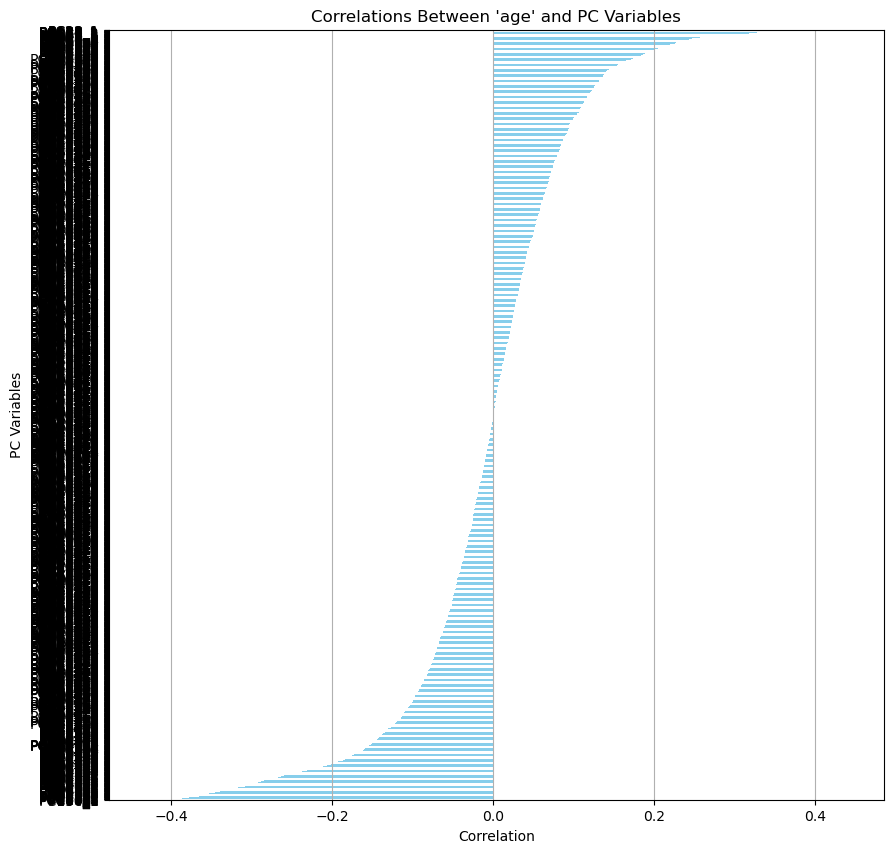

In [349]:
# Filter the PC columns
pc_columns = [col for col in train_reduced.columns if 'PC' in col]

# Calculate correlations between 'age' and the PC columns
age_correlations = train_reduced[['age'] + pc_columns].corr()['age'].drop('age')

# Display the correlations
print("Correlations between 'age' and PC variables:")
print(age_correlations)

# Visualize the correlations with a bar plot

plt.figure(figsize=(10, 10))
age_correlations.sort_values().plot(kind='barh', color='skyblue')
plt.title("Correlations Between 'age' and PC Variables")
plt.xlabel("Correlation")
plt.ylabel("PC Variables")
plt.grid(axis='x')
plt.show()

Next, we will apply PCA to the data in the test set, based on the variables grouped into clusters previously defined in final_results.

If a cluster contains fewer than 10 variables, or if the number of principal components required to explain at least 80% of the total variance exceeds 60% of the total number of variables in the cluster, that cluster will be ignored.

In [350]:
# DataFrame to store all principal components for the test set
test_PCA = pd.DataFrame(index=test.index)

# Iterate through each cluster in final_results
unique_clusters = final_results['Cluster'].unique()
print(f"Total number of clusters: {len(unique_clusters)}")

for cluster in unique_clusters:
    print(f"\nProcessing Cluster = {cluster}...")

    # Identify variables for the current cluster
    cluster_variables = final_results[final_results['Cluster'] == cluster]['Variable'].tolist()
    num_variables = len(cluster_variables)

    # Skip clusters with fewer than 10 variables
    if num_variables < 10:
        print(f"Cluster {cluster}: Skipped because it has only {num_variables} variables.")
        continue

    print(f"Cluster {cluster}: {num_variables} variables identified.")

    # Select variables from train and test
    train_cluster = train[cluster_variables]
    test_cluster = test[cluster_variables]

    # Apply PCA on train and transform test
    pca = PCA()
    train_cluster_pca = pca.fit_transform(train_cluster)

    # Calculate the number of components for 80% explained variance
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = explained_variance.cumsum()

    # Determine the number of components for which cumulative explained variance exceeds 80%
    n_components = np.argmax(cumulative_variance >= 0.80) + 1
    print(f"Cluster {cluster}: Number of components for 80% explained variance: {n_components}")

    # Check if the number of components exceeds 60% of the number of variables
    if n_components > 0.6 * num_variables:
        print(f"Cluster {cluster}: Skipped because the number of components ({n_components}) exceeds 60% of the number of variables ({num_variables}).")
        continue

    # Transform test based on PCA fitted on train
    test_cluster_pca = pca.transform(test_cluster)[:, :n_components]

    # Create a DataFrame with the principal components
    # Column names: PCi_1, PCi_2, ..., PCi_n (where i = cluster number)
    columns = [f"PC{cluster}_{i+1}" for i in range(n_components)]
    cluster_PCA_test = pd.DataFrame(test_cluster_pca, columns=columns, index=test.index)

    # Add the principal components for the current cluster to test_PCA
    test_PCA = pd.concat([test_PCA, cluster_PCA_test], axis=1)

print(f"\nFinal shape of the test_PCA DataFrame: {test_PCA.shape}")

Total number of clusters: 927

Processing Cluster = 699...
Cluster 699: 20 variables identified.
Cluster 699: Number of components for 80% explained variance: 14
Cluster 699: Skipped because the number of components (14) exceeds 60% of the number of variables (20).

Processing Cluster = 294...
Cluster 294: 21 variables identified.
Cluster 294: Number of components for 80% explained variance: 15
Cluster 294: Skipped because the number of components (15) exceeds 60% of the number of variables (21).

Processing Cluster = 189...
Cluster 189: 26 variables identified.
Cluster 189: Number of components for 80% explained variance: 14

Processing Cluster = 92...
Cluster 92: 35 variables identified.
Cluster 92: Number of components for 80% explained variance: 15

Processing Cluster = 61...
Cluster 61: 37 variables identified.
Cluster 61: Number of components for 80% explained variance: 16

Processing Cluster = 5...
Cluster 5: 43 variables identified.
Cluster 5: Number of components for 80% expla

Next, we check that the principal components have been saved identically in both the train and test sets.

In [351]:
# Get the lists of columns from train_PCA and test_PCA
train_columns = set(train_PCA.columns)
test_columns = set(test_PCA.columns)

# Check if the two sets of columns are identical
if train_columns == test_columns:
    print("The variables in train_PCA and test_PCA are identical.")
else:
    print("There are differences between the variables in train_PCA and test_PCA.")

    # Identify the variables missing from test_PCA
    missing_in_test = train_columns - test_columns
    if missing_in_test:
        print(f"Variables missing from test_PCA: {missing_in_test}")

    # Identify the variables missing from train_PCA
    missing_in_train = test_columns - train_columns
    if missing_in_train:
        print(f"Variables missing from train_PCA: {missing_in_train}")

The variables in train_PCA and test_PCA are identical.


Finally, we will merge the DataFrame containing the resulting principal components with the patients’ demographic data (age, sex, race, etc.).

In [352]:
# Exclude the variables from numeric_cols in the test dataset
test_remaining = test.drop(columns=numeric_cols, errors='ignore')

# Combine test_PCA with test_remaining
test_reduced = pd.concat([test_remaining, test_PCA], axis=1)

print(f"Final shape of the test_reduced DataFrame: {test_reduced.shape}")

Final shape of the test_reduced DataFrame: (474, 2949)


In [ ]:
test_reduced

Below, we checked the dimensions of the train_reduced and test_reduced DataFrames and observed that they differ only by two variables, age and age_group which are not present in the test set.

In [353]:
# Get the sets of column names for both DataFrames
train_columns = set(train_reduced.columns)
test_columns = set(test_reduced.columns)

# Find variables in train_reduced but not in test_reduced
missing_in_test = train_columns - test_columns

# Display the results
if missing_in_test:
    print(f"Variables in train_reduced but not in test_reduced: {missing_in_test}")
else:
    print("All variables in train_reduced are present in test_reduced.")

Variables in train_reduced but not in test_reduced: {'age_group', 'age'}


# IV. Imputing Missing Values for TRAIN and TEST

Next, we will check the number of missing values in the metadata for both the train and test sets, with the goal of imputing them.

In [354]:
variables_to_check = ['bmi', 'ethnicity', 'race', 'parent_1_education','parent_2_education']

missing_info = pd.DataFrame({
    'Variable': variables_to_check,
    'Missing Count': [train_reduced[var].isna().sum() for var in variables_to_check],
    'Missing Percentage (%)': [train_reduced[var].isna().mean() * 100 for var in variables_to_check]
})

print(missing_info)

             Variable  Missing Count  Missing Percentage (%)
0                 bmi             18                     1.6
1           ethnicity            109                     9.9
2                race            168                    15.2
3  parent_1_education            183                    16.6
4  parent_2_education             22                     2.0


In [355]:
variables_to_check = ['bmi', 'ethnicity', 'race', 'parent_1_education','parent_2_education']

missing_info = pd.DataFrame({
    'Variable': variables_to_check,
    'Missing Count': [test_reduced[var].isna().sum() for var in variables_to_check],
    'Missing Percentage (%)': [test_reduced[var].isna().mean() * 100 for var in variables_to_check]
})

print(missing_info)

             Variable  Missing Count  Missing Percentage (%)
0                 bmi              9                     1.9
1           ethnicity             55                    11.6
2                race             72                    15.2
3  parent_1_education             84                    17.7
4  parent_2_education             10                     2.1


## 1. Imputing the variable `'bmi'`

First, we want to examine the correlations between the bmi variable and the other numerical variables. We will convert the sex variable into sex_num so that it can be used in the analysis, and then we will calculate the correlation coefficients between all variables and bmi.

In [356]:
# Creating the 'sex_num' variable assigning 0  to 'male' and 1 to 'female'
train_reduced['sex_num'] = train_reduced['sex'].map({'Male': 0, 'Female': 1})

# Checking the data type of the new variable
print(train_reduced['sex_num'].dtype)

int64


In [357]:
# Select numeric variables
short_num = ['bmi', 'sex_num', 'age', 'p_factor_fs', 'internalizing_fs', 'externalizing_fs', 'attention_fs']

# Calculate the correlation between BMI and the other numeric variables
correlations = train_reduced[short_num].corr()['bmi']

# Exclude the self-correlation (bmi with bmi)
correlations = correlations.drop('bmi')

print("Correlations between BMI and other numeric variables:")
print(correlations)

Correlations between BMI and other numeric variables:
sex_num             0.0
age                 0.5
p_factor_fs         0.1
internalizing_fs    0.1
externalizing_fs   -0.1
attention_fs       -0.1
Name: bmi, dtype: float64


We observe that the strongest correlation is between bmi and age. However, since the age variable is not present in the test dataset, we opted for a simple imputation of the missing bmi values using the mean calculated within sex-based groups. This approach was considered appropriate given the very small number of missing values for the bmi variable.

In [358]:
# Calculate the mean BMI for each sex group
mean_bmi_by_sex = train_reduced.groupby('sex')['bmi'].transform('mean')

# Impute missing BMI values with the mean BMI for the corresponding sex
train_reduced['bmi'] = train_reduced['bmi'].fillna(mean_bmi_by_sex)

In [359]:
missing_bmi_count = train_reduced['bmi'].isnull().sum()

print(f"Number of missing values for BMI: {missing_bmi_count}")

Number of missing values for BMI: 0


We will apply the same imputation method for the bmi variable in the test dataset

In [360]:
test_reduced['sex_num'] = test_reduced['sex'].map({'Male': 0, 'Female': 1})

print(test_reduced['sex_num'].dtype)

int64


In [361]:
# Calculate the mean BMI for each sex group
mean_bmi_by_sex = test_reduced.groupby('sex')['bmi'].transform('mean')

# Impute missing BMI values with the mean BMI for the corresponding sex
test_reduced['bmi'] = test_reduced['bmi'].fillna(mean_bmi_by_sex)

In [362]:
missing_bmi_count = test_reduced['bmi'].isnull().sum()

print(f"Number of missing values for BMI: {missing_bmi_count}")

Number of missing values for BMI: 0


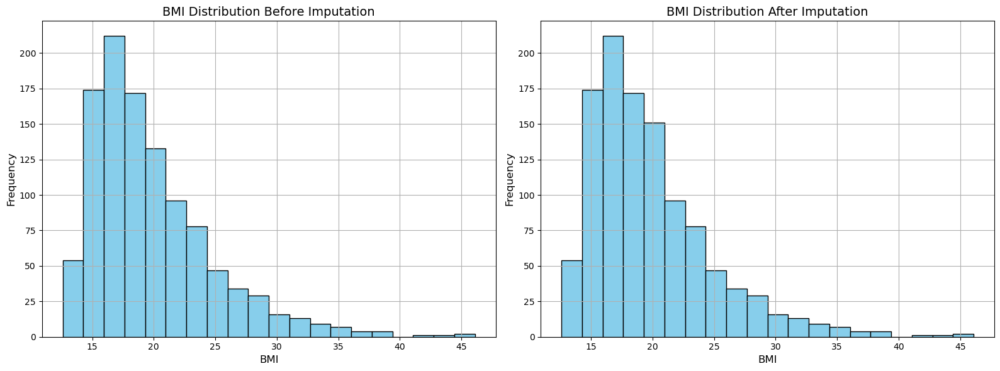

In [363]:
# Create figure with 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Chart 1 - BMI distribution before imputation
axes[0].hist(train_short['bmi'], bins=20, edgecolor='black', color='skyblue')
axes[0].set_title('BMI Distribution Before Imputation', fontsize=14)
axes[0].set_xlabel('BMI', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].grid(True)  # Enable grid for the first chart

# Chart 2 - BMI distribution after imputation
axes[1].hist(train_reduced['bmi'], bins=20, edgecolor='black', color='skyblue')
axes[1].set_title('BMI Distribution After Imputation', fontsize=14)
axes[1].set_xlabel('BMI', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].grid(True)  # Enable grid for the second chart

# Display charts
plt.tight_layout()
plt.show()

## 2. Imputing the variables `'ethnicity'` and `'race'`

### Correlations between `ethnicity`, `race` and the other variables

Before imputing the race and ethnicity variables, we will examine the correlations between variables using Cramer's V coefficient (for nominal × nominal associations) and the Spearman rank correlation coefficient (for nominal × ordinal associations).

In [364]:
# Function to calculate Cramer's V
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    k = min(confusion_matrix.shape) - 1
    return np.sqrt(chi2 / (n * k))

# Variables to calculate
variables = ['race', 'handedness', 'study_site']
cramers_v_results = {}

for var in variables:
    # Create the contingency table
    contingency_table = pd.crosstab(train_reduced['ethnicity'], train_reduced[var])
    # Calculate Cramer's V
    cramers_v_results[var] = cramers_v(contingency_table)

print("Cramer's V coefficient between ethnicity and other variables:")
for var, value in cramers_v_results.items():
    print(f"{var}: {value:.2f}")

Cramer's V coefficient between ethnicity and other variables:
race: 0.42
handedness: 0.02
study_site: 0.07


In [365]:
# Variables for calculating Cramer's V
variables = ['sex', 'study_site', 'ethnicity', 'handedness']
cramers_v_results = {}

for var in variables:
    # Create the contingency table
    contingency_table = pd.crosstab(train_reduced['race'], train_reduced[var])
    # Calculate Cramer's V
    cramers_v_results[var] = cramers_v(contingency_table)

print("Cramer's V coefficient between race and other variables:")
for var, value in cramers_v_results.items():
    print(f"{var}: {value:.2f}")

Cramer's V coefficient between race and other variables:
sex: 0.05
study_site: 0.10
ethnicity: 0.42
handedness: 0.10


In [366]:
# Calculate Spearman coefficient for ordinal variables
ordinal_vars = ['parent_1_education', 'parent_2_education']
spearman_results = {}

for var in ordinal_vars:
    # Filter out missing values
    valid_data = train_reduced[['ethnicity', var]].dropna()
    correlation, _ = spearmanr(valid_data['ethnicity'], valid_data[var])
    spearman_results[var] = correlation

print("Spearman Rank coefficient between ethnicity and ordinal variables:")
for var, value in spearman_results.items():
    print(f"{var}: {value:.2f}")

Spearman Rank coefficient between ethnicity and ordinal variables:
parent_1_education: 0.23
parent_2_education: 0.15


In [367]:
# Calculate Spearman coefficient for ordinal variables
ordinal_vars = ['parent_1_education', 'parent_2_education']
spearman_results = {}

for var in ordinal_vars:
    # Filter out missing values
    valid_data = train_reduced[['race', var]].dropna()
    correlation, _ = spearmanr(valid_data['race'], valid_data[var])
    spearman_results[var] = correlation

print("Spearman Rank coefficient between race and ordinal variables:")
for var, value in spearman_results.items():
    print(f"{var}: {value:.2f}")

Spearman Rank coefficient between race and ordinal variables:
parent_1_education: 0.09
parent_2_education: 0.05


We observe that the strongest correlation—for both race and ethnicity—is between each other, with a value of 0.42. Therefore, we developed a method that allows for imputing the race variable based on the corresponding value of ethnicity, and vice versa, in a simultaneous and reciprocal manner.

### Actual Imputation for `ethnicity` and `race`

The imputation method we chose for race and ethnicity works as follows:

*   If a patient's race is missing, we check their ethnicity and replace the missing race value with the modal race corresponding to the observed ethnicity across the dataset.

*   If a patient's ethnicity is missing, we check their race and replace the missing ethnicity value with the modal ethnicity corresponding to the observed race.

*   If both race and ethnicity are missing, we fill in both values using the overall modal value for race and ethnicity, respectively.

In [368]:
# Calculate modal values from complete rows (no missing values in 'race' and 'ethnicity')
ethnicity_race_complete = train_reduced.dropna(subset=['race', 'ethnicity'])
modal_race_by_ethnicity = ethnicity_race_complete.groupby('ethnicity')['race'].agg(lambda x: x.mode().iloc[0])
modal_ethnicity_by_race = ethnicity_race_complete.groupby('race')['ethnicity'].agg(lambda x: x.mode().iloc[0])
modal_race_overall = ethnicity_race_complete['race'].mode().iloc[0]
modal_ethnicity_overall = ethnicity_race_complete['ethnicity'].mode().iloc[0]

# Impute missing values directly in train_reduced
def impute_row(row):
    if pd.isna(row['race']) and not pd.isna(row['ethnicity']):
        # Impute `race` using the modal race value for the given ethnicity
        row['race'] = modal_race_by_ethnicity.get(row['ethnicity'], modal_race_overall)
    if pd.isna(row['ethnicity']) and not pd.isna(row['race']):
        # Impute `ethnicity` using the modal ethnicity value for the given race
        row['ethnicity'] = modal_ethnicity_by_race.get(row['race'], modal_ethnicity_overall)
    if pd.isna(row['race']) and pd.isna(row['ethnicity']):
        # Impute both using overall modal values
        row['race'] = modal_race_overall
        row['ethnicity'] = modal_ethnicity_overall
    return row

# Apply the function directly on train_reduced
train_reduced = train_reduced.apply(impute_row, axis=1)

# Check for missing values after imputation
print("Number of missing values for 'race' after imputation:", train_reduced['race'].isnull().sum())
print("Number of missing values for 'ethnicity' after imputation:", train_reduced['ethnicity'].isnull().sum())

Number of missing values for 'race' after imputation: 0
Number of missing values for 'ethnicity' after imputation: 0


We applied the same imputation method for the missing values of the race and ethnicity variables in the test set.

In [369]:
# Calculate modal values from complete rows (no missing values in 'race' and 'ethnicity')
ethnicity_race_complete = test_reduced.dropna(subset=['race', 'ethnicity'])
modal_race_by_ethnicity = ethnicity_race_complete.groupby('ethnicity')['race'].agg(lambda x: x.mode().iloc[0])
modal_ethnicity_by_race = ethnicity_race_complete.groupby('race')['ethnicity'].agg(lambda x: x.mode().iloc[0])
modal_race_overall = ethnicity_race_complete['race'].mode().iloc[0]
modal_ethnicity_overall = ethnicity_race_complete['ethnicity'].mode().iloc[0]

# Impute missing values directly in test_reduced
def impute_row(row):
    if pd.isna(row['race']) and not pd.isna(row['ethnicity']):
        # Impute `race` using the modal race value for the given ethnicity
        row['race'] = modal_race_by_ethnicity.get(row['ethnicity'], modal_race_overall)
    if pd.isna(row['ethnicity']) and not pd.isna(row['race']):
        # Impute `ethnicity` using the modal ethnicity value for the given race
        row['ethnicity'] = modal_ethnicity_by_race.get(row['race'], modal_ethnicity_overall)
    if pd.isna(row['race']) and pd.isna(row['ethnicity']):
        # Impute both using overall modal values
        row['race'] = modal_race_overall
        row['ethnicity'] = modal_ethnicity_overall
    return row

# Apply the function directly on test_reduced
test_reduced = test_reduced.apply(impute_row, axis=1)

# Check for missing values after imputation
print("Number of missing values for 'race' after imputation:", test_reduced['race'].isnull().sum())
print("Number of missing values for 'ethnicity' after imputation:", test_reduced['ethnicity'].isnull().sum())

Number of missing values for 'race' after imputation: 0
Number of missing values for 'ethnicity' after imputation: 0


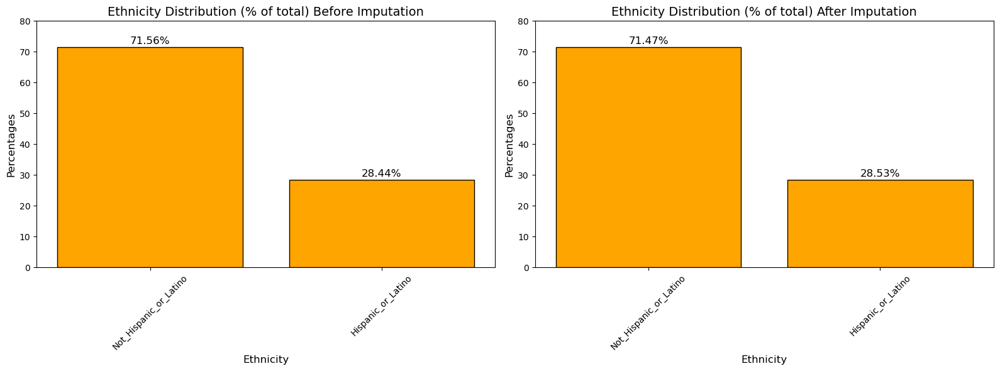

In [370]:
# Calculate percentages for each category in 'ethnicity' (before imputation)
ethnicity_counts_before = pd.Series(train_short['ethnicity']).value_counts(normalize=True) * 100

# Calculate percentages for each category in 'ethnicity' (after imputation)
ethnicity_counts_after = pd.Series(train_reduced['ethnicity']).value_counts(normalize=True) * 100

# Create figure with 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Chart 1 - Ethnicity distribution before imputation
axes[0].bar(ethnicity_counts_before.index, ethnicity_counts_before, color='orange', edgecolor='black')
axes[0].set_title('Ethnicity Distribution (% of total) Before Imputation', fontsize=14)
axes[0].set_xlabel('Ethnicity', fontsize=12)
axes[0].set_ylabel('Percentages', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)

# Adjust Y-axis limit to fully show percentages
axes[0].set_ylim(0, 80)

# Add percentage labels on each bar
for i, value in enumerate(ethnicity_counts_before):
    axes[0].text(i, value + 1, f'{value:.2f}%', ha='center', fontsize=12)

# Chart 2 - Ethnicity distribution after imputation
axes[1].bar(ethnicity_counts_after.index, ethnicity_counts_after, color='orange', edgecolor='black')
axes[1].set_title('Ethnicity Distribution (% of total) After Imputation', fontsize=14)
axes[1].set_xlabel('Ethnicity', fontsize=12)
axes[1].set_ylabel('Percentages', fontsize=12)
axes[1].tick_params(axis='x', rotation=45)

# Adjust Y-axis limit to fully show percentages
axes[1].set_ylim(0, 80)

# Add percentage labels on each bar
for i, value in enumerate(ethnicity_counts_after):
    axes[1].text(i, value + 1, f'{value:.2f}%', ha='center', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()

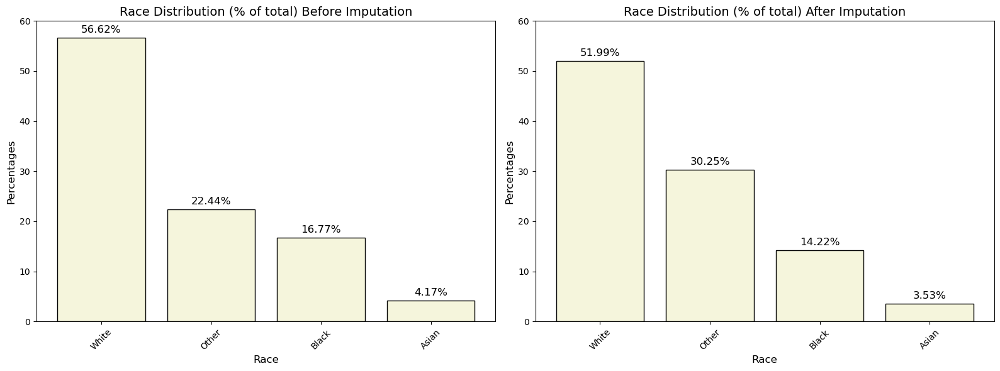

In [371]:
# Calculate percentages for each category in 'race' (before imputation)
race_counts_before = pd.Series(train_short['race']).value_counts(normalize=True) * 100

# Calculate percentages for each category in 'race' (after imputation)
race_counts_after = pd.Series(train_reduced['race']).value_counts(normalize=True) * 100

# Create figure with 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Chart 1 - Race distribution before imputation
axes[0].bar(race_counts_before.index, race_counts_before, color='beige', edgecolor='black')
axes[0].set_title('Race Distribution (% of total) Before Imputation', fontsize=14)
axes[0].set_xlabel('Race', fontsize=12)
axes[0].set_ylabel('Percentages', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)

# Adjust Y-axis limit to fully show percentages
axes[0].set_ylim(0, 60)

# Add percentage labels on each bar
for i, value in enumerate(race_counts_before):
    axes[0].text(i, value + 1, f'{value:.2f}%', ha='center', fontsize=12)

# Chart 2 - Race distribution after imputation
axes[1].bar(race_counts_after.index, race_counts_after, color='beige', edgecolor='black')
axes[1].set_title('Race Distribution (% of total) After Imputation', fontsize=14)
axes[1].set_xlabel('Race', fontsize=12)
axes[1].set_ylabel('Percentages', fontsize=12)
axes[1].tick_params(axis='x', rotation=45)

# Adjust Y-axis limit to fully show percentages
axes[1].set_ylim(0, 60)

# Add percentage labels on each bar
for i, value in enumerate(race_counts_after):
    axes[1].text(i, value + 1, f'{value:.2f}%', ha='center', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()

## 3. Imputing the variables `'parent_1_education'` and `'parent_2_education'`

### Correlations between `parent_1_education`, `parent_2_education` and other variables

Like before, we want to examine how the parent_1_education and parent_2_education variables correlate with the other categorical variables.

In [372]:
# Convert nominal variables to numeric values
nominal_vars = ['race', 'study_site', 'handedness']
for var in nominal_vars:
    train_reduced[var] = train_reduced[var].astype('category').cat.codes

# Variables for Spearman Rank calculation
ordinal_vars = ['parent_1_education', 'parent_2_education']
spearman_results = {}

for ordinal_var in ordinal_vars:
    for nominal_var in nominal_vars:
        # print(f"Analyzing {ordinal_var} and {nominal_var}...")
        # Filter out missing values
        valid_data = train_reduced[[ordinal_var, nominal_var]].dropna()
        # print(f"Valid data:\n{valid_data}")
        if not valid_data.empty:
            correlation, _ = spearmanr(valid_data[ordinal_var], valid_data[nominal_var])
            spearman_results[(ordinal_var, nominal_var)] = correlation

print("Spearman Rank coefficient between ordinal and nominal variables:")
for (ordinal, nominal), value in spearman_results.items():
    print(f"{ordinal} and {nominal}: {value:.2f}")

Spearman Rank coefficient between ordinal and nominal variables:
parent_1_education and race: 0.11
parent_1_education and study_site: -0.21
parent_1_education and handedness: -0.02
parent_2_education and race: 0.06
parent_2_education and study_site: -0.14
parent_2_education and handedness: 0.04


In [373]:
# Filter out missing values
valid_data = train_reduced[['parent_1_education', 'parent_2_education']].dropna()

# Calculate Spearman Rank correlation between ordinal variables
if not valid_data.empty:
    correlation, _ = spearmanr(valid_data['parent_1_education'], valid_data['parent_2_education'])
    print(f"Spearman Rank correlation between parent_1_education and parent_2_education: {correlation:.2f}")
else:
    print("Not enough data to calculate Spearman Rank correlation.")

Spearman Rank correlation between parent_1_education and parent_2_education: 0.29


We observe that the strongest correlation is between the variables parent_1_education and parent_2_education. Therefore, we will apply the same method previously used for imputing the race and ethnicity variables, in order to impute the missing values in parent_1_education based on the values in parent_2_education, and vice versa.

### Actual Imputation for `parent_1_education` and `parent_2_education`

The imputation method we chose for parent_1_education and parent_2_education is as follows:

*   If the education level of parent 1 is missing for a given patient, we look at the education level of parent 2 and replace the missing value with the modal value of parent 1's education corresponding to that level of parent 2's education.

*   In short, if parent 1's education is missing and, for example, parent 2's education is 'Complete_tertiary', we check which value is most frequent for parent 1 when parent 2 has tertiary education, and use that modal value for imputation.

*   If both parent_1_education and parent_2_education are missing, we replace the missing values with the overall modal value for each variable, respectively.

In [374]:
# Calculate modal values from complete rows
education_complete = train_reduced.dropna(subset=['parent_1_education', 'parent_2_education'])

# Modal values for each pair of variables
modal_parent_1_by_parent_2 = education_complete.groupby('parent_2_education')['parent_1_education'].agg(lambda x: x.mode().iloc[0])
modal_parent_2_by_parent_1 = education_complete.groupby('parent_1_education')['parent_2_education'].agg(lambda x: x.mode().iloc[0])
modal_parent_1_overall = education_complete['parent_1_education'].mode().iloc[0]
modal_parent_2_overall = education_complete['parent_2_education'].mode().iloc[0]

# Imputation function
def impute_parent_education(row):
    if pd.isna(row['parent_1_education']) and not pd.isna(row['parent_2_education']):
        # Impute `parent_1_education` using the modal value for `parent_2_education`
        row['parent_1_education'] = modal_parent_1_by_parent_2.get(row['parent_2_education'], modal_parent_1_overall)
    if pd.isna(row['parent_2_education']) and not pd.isna(row['parent_1_education']):
        # Impute `parent_2_education` using the modal value for `parent_1_education`
        row['parent_2_education'] = modal_parent_2_by_parent_1.get(row['parent_1_education'], modal_parent_2_overall)
    if pd.isna(row['parent_1_education']) and pd.isna(row['parent_2_education']):
        # Impute both using overall modal values
        row['parent_1_education'] = modal_parent_1_overall
        row['parent_2_education'] = modal_parent_2_overall
    return row

# Apply the function directly to train_reduced
train_reduced = train_reduced.apply(impute_parent_education, axis=1)

# Check for missing values after imputation
print("Number of missing values for 'parent_1_education' after imputation:", train_reduced['parent_1_education'].isnull().sum())
print("Number of missing values for 'parent_2_education' after imputation:", train_reduced['parent_2_education'].isnull().sum())

Number of missing values for 'parent_1_education' after imputation: 0
Number of missing values for 'parent_2_education' after imputation: 0


We will apply the same method to the test dataset

In [375]:
# Calculate modal values from complete rows
education_complete = test_reduced.dropna(subset=['parent_1_education', 'parent_2_education'])

# Modal values for each pair of variables
modal_parent_1_by_parent_2 = education_complete.groupby('parent_2_education')['parent_1_education'].agg(lambda x: x.mode().iloc[0])
modal_parent_2_by_parent_1 = education_complete.groupby('parent_1_education')['parent_2_education'].agg(lambda x: x.mode().iloc[0])
modal_parent_1_overall = education_complete['parent_1_education'].mode().iloc[0]
modal_parent_2_overall = education_complete['parent_2_education'].mode().iloc[0]

# Imputation function
def impute_parent_education(row):
    if pd.isna(row['parent_1_education']) and not pd.isna(row['parent_2_education']):
        # Impute `parent_1_education` using the modal value for `parent_2_education`
        row['parent_1_education'] = modal_parent_1_by_parent_2.get(row['parent_2_education'], modal_parent_1_overall)
    if pd.isna(row['parent_2_education']) and not pd.isna(row['parent_1_education']):
        # Impute `parent_2_education` using the modal value for `parent_1_education`
        row['parent_2_education'] = modal_parent_2_by_parent_1.get(row['parent_1_education'], modal_parent_2_overall)
    if pd.isna(row['parent_1_education']) and pd.isna(row['parent_2_education']):
        # Impute both using overall modal values
        row['parent_1_education'] = modal_parent_1_overall
        row['parent_2_education'] = modal_parent_2_overall
    return row

# Apply the function directly to test_reduced
test_reduced = test_reduced.apply(impute_parent_education, axis=1)

# Check for missing values after imputation
print("Number of missing values for 'parent_1_education' after imputation:", test_reduced['parent_1_education'].isnull().sum())
print("Number of missing values for 'parent_2_education' after imputation:", test_reduced['parent_2_education'].isnull().sum())

Number of missing values for 'parent_1_education' after imputation: 0
Number of missing values for 'parent_2_education' after imputation: 0


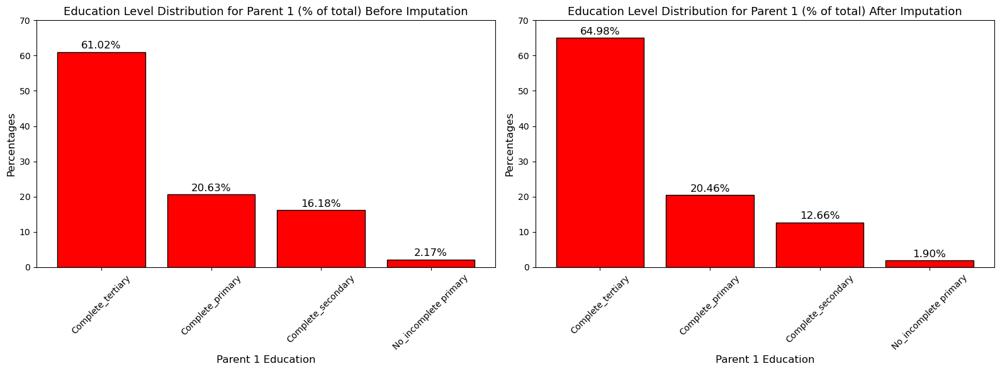

In [376]:
# Calculate percentages for each category in 'parent_1_education' (before imputation)
education_counts_before = pd.Series(train_short['parent_1_education']).value_counts(normalize=True) * 100

# Calculate percentages for each category in 'parent_1_education' (after imputation)
education_counts_after = pd.Series(test_reduced['parent_1_education']).value_counts(normalize=True) * 100

# Create figure with 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Chart 1 - Education distribution for parent 1 before imputation
axes[0].bar(education_counts_before.index, education_counts_before, color='red', edgecolor='black')
axes[0].set_title('Education Level Distribution for Parent 1 (% of total) Before Imputation', fontsize=13)
axes[0].set_xlabel('Parent 1 Education', fontsize=12)
axes[0].set_ylabel('Percentages', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)

# Adjust Y-axis to allow full view of percentages
axes[0].set_ylim(0, 70)

# Add percentage labels on each bar
for i, value in enumerate(education_counts_before):
    axes[0].text(i, value + 1, f'{value:.2f}%', ha='center', fontsize=12)

# Chart 2 - Education distribution for parent 1 after imputation
axes[1].bar(education_counts_after.index, education_counts_after, color='red', edgecolor='black')
axes[1].set_title('Education Level Distribution for Parent 1 (% of total) After Imputation', fontsize=13)
axes[1].set_xlabel('Parent 1 Education', fontsize=12)
axes[1].set_ylabel('Percentages', fontsize=12)
axes[1].tick_params(axis='x', rotation=45)

# Adjust Y-axis to allow full view of percentages
axes[1].set_ylim(0, 70)

# Add percentage labels on each bar
for i, value in enumerate(education_counts_after):
    axes[1].text(i, value + 1, f'{value:.2f}%', ha='center', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()

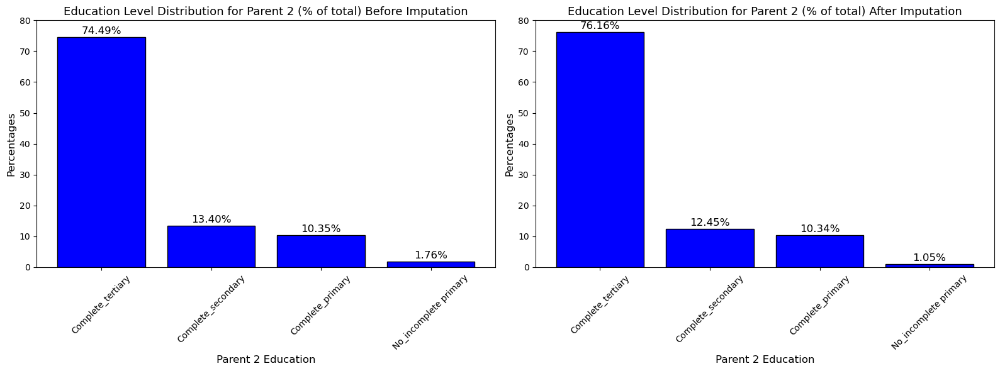

In [377]:
# Calculate percentages for each category in 'parent_2_education' (before imputation)
education_counts_before = pd.Series(train_short['parent_2_education']).value_counts(normalize=True) * 100

# Calculate percentages for each category in 'parent_2_education' (after imputation)
education_counts_after = pd.Series(test_reduced['parent_2_education']).value_counts(normalize=True) * 100

# Create figure with 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Chart 1 - Education distribution for parent 2 before imputation
axes[0].bar(education_counts_before.index, education_counts_before, color='blue', edgecolor='black')
axes[0].set_title('Education Level Distribution for Parent 2 (% of total) Before Imputation', fontsize=13)
axes[0].set_xlabel('Parent 2 Education', fontsize=12)
axes[0].set_ylabel('Percentages', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)

# Adjust Y-axis to allow full view of percentages
axes[0].set_ylim(0, 80)

# Add percentage labels on each bar
for i, value in enumerate(education_counts_before):
    axes[0].text(i, value + 1, f'{value:.2f}%', ha='center', fontsize=12)

# Chart 2 - Education distribution for parent 2 after imputation
axes[1].bar(education_counts_after.index, education_counts_after, color='blue', edgecolor='black')
axes[1].set_title('Education Level Distribution for Parent 2 (% of total) After Imputation', fontsize=13)
axes[1].set_xlabel('Parent 2 Education', fontsize=12)
axes[1].set_ylabel('Percentages', fontsize=12)
axes[1].tick_params(axis='x', rotation=45)

# Adjust Y-axis to allow full view of percentages
axes[1].set_ylim(0, 80)

# Add percentage labels on each bar
for i, value in enumerate(education_counts_after):
    axes[1].text(i, value + 1, f'{value:.2f}%', ha='center', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()

### Final Check

After all the imputation methods applied there are no more missing values in the train and test dataset 

In [378]:
print("Missing values in train:", pd.isna(train_reduced).sum().sum())

Missing values in train: 0


In [379]:
print("Missing values in test:", pd.isna(test_reduced).sum().sum())

Missing values in test: 0


## Bonus: Analyzing the relationship between all mental factors (p_factor_fs, internalising_fs, externalizing_fs, attention_fs)

Next, we will perform an analysis of the scores 'p_factor_fs', 'internalizing_fs', 'externalizing_fs', and 'attention_fs', grouped by cluster. The Cluster variable will be obtained by applying the K-Means algorithm with 2 clusters.


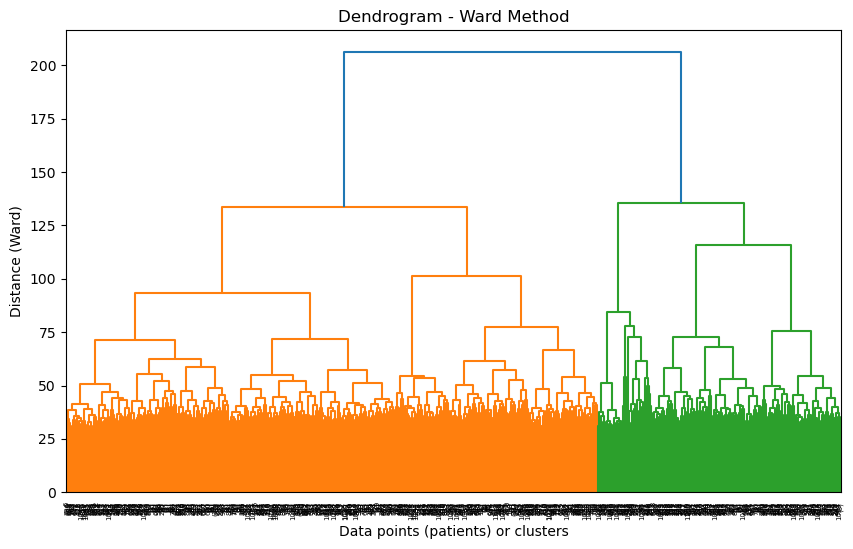

In [380]:
X = train[numeric_cols].values

Z = linkage(X, method='ward')

plt.figure(figsize=(10, 6))
dendrogram(
    Z,
    truncate_mode='level',
    p=10,
)
plt.title("Dendrogram - Ward Method")
plt.xlabel("Data points (patients) or clusters")
plt.ylabel("Distance (Ward)")
plt.show()

In [381]:
k = 2

kmeans = KMeans(n_clusters=k, random_state=42)
labels = kmeans.fit_predict(X)

train[numeric_cols]['cluster_label'] = labels

print(train[numeric_cols].head())

c:\Users\Francisca\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\Francisca\AppData\Local\Temp\ipykernel_13520\3584615890.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[numeric_cols]['cluster_label'] = labels
C:\Users\Francisca\AppData\Local\Temp\ipykernel_13520\3584615890.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

   0throw_100thcolumn  0throw_101thcolumn  0throw_102thcolumn  \
0                 0.8                 0.6                 0.5   
1                 0.8                -0.0                 0.7   
2                 0.7                 0.5                 0.4   
3                 0.6                 0.5                 0.3   
4                 0.8                 0.3                 0.6   

   0throw_103thcolumn  0throw_104thcolumn  0throw_105thcolumn  \
0                 0.3                 0.4                 0.7   
1                 0.3                 0.6                 0.7   
2                 0.2                 0.6                 0.6   
3                 0.0                 0.6                 0.5   
4                 0.5                 0.3                 0.7   

   0throw_106thcolumn  0throw_107thcolumn  0throw_108thcolumn  \
0                 0.6                 0.1                 0.3   
1                 0.6                 0.1                 0.6   
2                 0.5  

In [382]:
# Initialize KMeans
kmeans = KMeans(n_clusters=k, random_state=42)

# Train the model
labels = kmeans.fit_predict(X)

# Add the cluster labels to the existing dataframe
train['cluster_label'] = labels

# Create a new column to assign "CL1" or "CL2" based on the cluster
train['cluster_name'] = train['cluster_label'].apply(lambda x: 'CL1' if x == 0 else 'CL2')

# Display the first few rows to check the results
print(train[['cluster_label', 'cluster_name']].head())

c:\Users\Francisca\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


   cluster_label cluster_name
0              1          CL2
1              1          CL2
2              1          CL2
3              0          CL1
4              0          CL1


C:\Users\Francisca\AppData\Local\Temp\ipykernel_13520\2630184326.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train['cluster_label'] = labels
C:\Users\Francisca\AppData\Local\Temp\ipykernel_13520\2630184326.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train['cluster_name'] = train['cluster_label'].apply(lambda x: 'CL1' if x == 0 else 'CL2')


In [383]:
train['cluster_name'].value_counts()

cluster_name
CL2    739
CL1    365
Name: count, dtype: int64

### 1. Analysis of '`p_factor_fs`' by cluster (general factor for various mental health disorders)


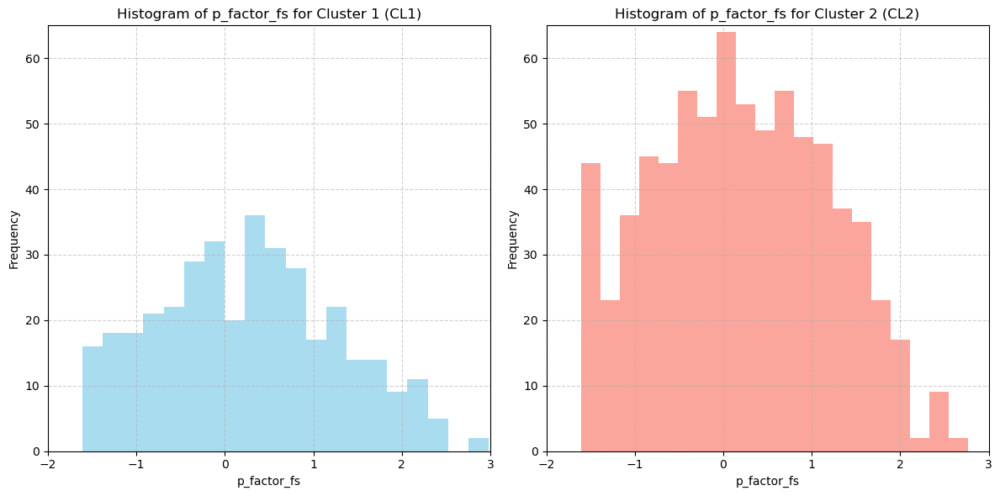

In [384]:
plt.figure(figsize=(12, 6))

# Histogram for "CL1" cluster
plt.subplot(1, 2, 1)
train[train['cluster_name'] == 'CL1']['p_factor_fs'].plot(kind='hist', bins=20, alpha=0.7, color='skyblue')
plt.title('Histogram of p_factor_fs for Cluster 1 (CL1)')
plt.xlabel('p_factor_fs')
plt.ylabel('Frequency')
plt.xlim(-2, 3)  # Set x-axis limits from -2 to 3
plt.ylim(0, 65)  # Set y-axis limits from 0 to 70
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid lines

# Histogram for "CL2" cluster
plt.subplot(1, 2, 2)
train[train['cluster_name'] == 'CL2']['p_factor_fs'].plot(kind='hist', bins=20, alpha=0.7, color='salmon')
plt.title('Histogram of p_factor_fs for Cluster 2 (CL2)')
plt.xlabel('p_factor_fs')
plt.ylabel('Frequency')
plt.xlim(-2, 3)  # Set x-axis limits from -2 to 3
plt.ylim(0, 65)  # Set y-axis limits from 0 to 70
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid lines

plt.tight_layout()
plt.show()

We observe that for both cluster 1 and cluster 2, the mode is around 0. However, a significant difference stands out between the two clusters: in cluster 2, the number of individuals with high scores is considerably greater. This suggests that individuals in cluster 2 show a stronger predisposition toward generalized psychological issues.

### 2. Analysis of the '`internalizing_fs`' variable by cluster (the internalizing factor reflecting emotional or mood-related issues)

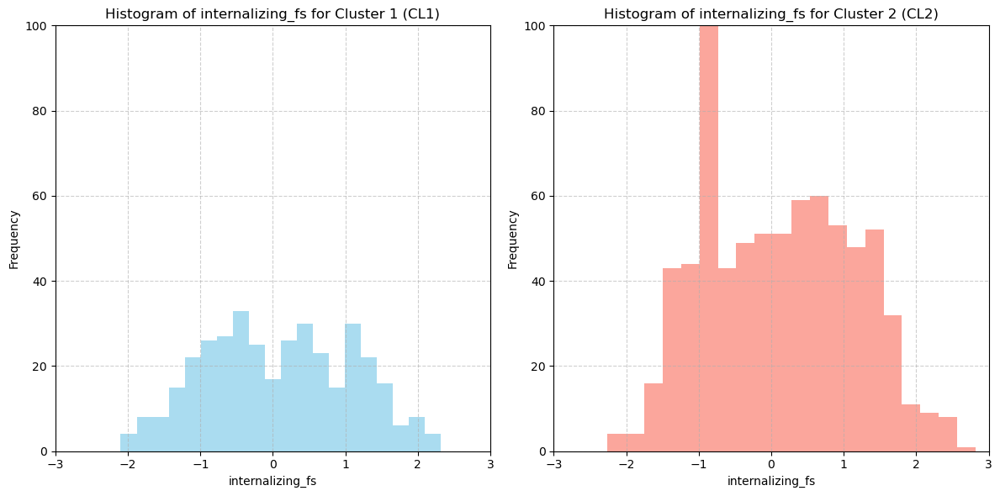

In [385]:
plt.figure(figsize=(12, 6))

# Histogram for "CL1" cluster
plt.subplot(1, 2, 1)
train[train['cluster_name'] == 'CL1']['internalizing_fs'].plot(kind='hist', bins=20, alpha=0.7, color='skyblue')
plt.title('Histogram of internalizing_fs for Cluster 1 (CL1)')
plt.xlabel('internalizing_fs')
plt.ylabel('Frequency')
plt.xlim(-3, 3)
plt.ylim(0, 100)
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid lines

# Histogram for "CL2" cluster
plt.subplot(1, 2, 2)
train[train['cluster_name'] == 'CL2']['internalizing_fs'].plot(kind='hist', bins=20, alpha=0.7, color='salmon')
plt.title('Histogram of internalizing_fs for Cluster 2 (CL2)')
plt.xlabel('internalizing_fs')
plt.ylabel('Frequency')
plt.xlim(-3, 3)
plt.ylim(0, 100)
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid lines

plt.tight_layout()
plt.show()

Significant differences are observed between the distributions of the two clusters regarding the variable that measures inward-oriented emotional dysfunctions. In Cluster 1, the distribution is uniform, including both individuals with internalizing problems and those without such difficulties. In contrast, Cluster 2 stands out through a high concentration around the modal value of -1, as well as a greater number of positive scores, suggesting a higher prevalence of individuals with internalizing problems in this group.

### 3. Analysis by cluster of the variable '`externalizing_fs`' (the externalizing factor, which reflects behavioral dysregulation, including conduct problems, aggressive behavior, and rule-breaking)

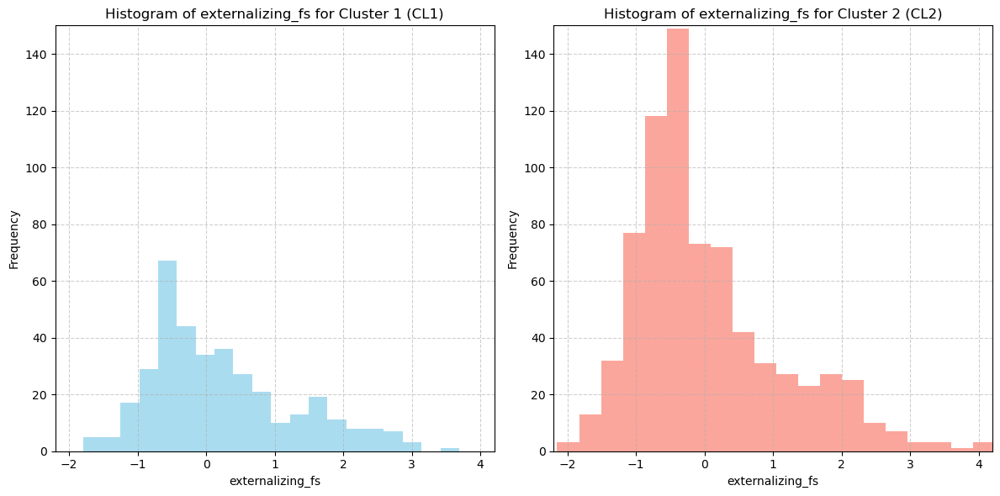

In [386]:
plt.figure(figsize=(12, 6))

# Histogram for "CL1" cluster
plt.subplot(1, 2, 1)
train[train['cluster_name'] == 'CL1']['externalizing_fs'].plot(kind='hist', bins=20, alpha=0.7, color='skyblue')
plt.title('Histogram of externalizing_fs for Cluster 1 (CL1)')
plt.xlabel('externalizing_fs')
plt.ylabel('Frequency')
plt.xlim(-2.2, 4.2)
plt.ylim(0, 150)
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid lines

# Histogram for "CL2" cluster
plt.subplot(1, 2, 2)
train[train['cluster_name'] == 'CL2']['externalizing_fs'].plot(kind='hist', bins=20, alpha=0.7, color='salmon')
plt.title('Histogram of externalizing_fs for Cluster 2 (CL2)')
plt.xlabel('externalizing_fs')
plt.ylabel('Frequency')
plt.xlim(-2.2, 4.2)
plt.ylim(0, 150)
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid lines

plt.tight_layout()
plt.show()

We observe that, in both cases, the distribution of the variable is concentrated around negative values, suggesting a generally low level of aggressiveness and behavioral issues. However, when it comes to positive scores, there is a slight difference between the two clusters: Cluster 2 includes a slightly higher number of individuals with positive values, indicating a somewhat greater predisposition toward aggressive behaviors in this group.

### 4. Analysis by cluster of the variable '`attention_fs`' (the attention factor, which reflects attention deficit, as well as hyperactivity and impulsivity)

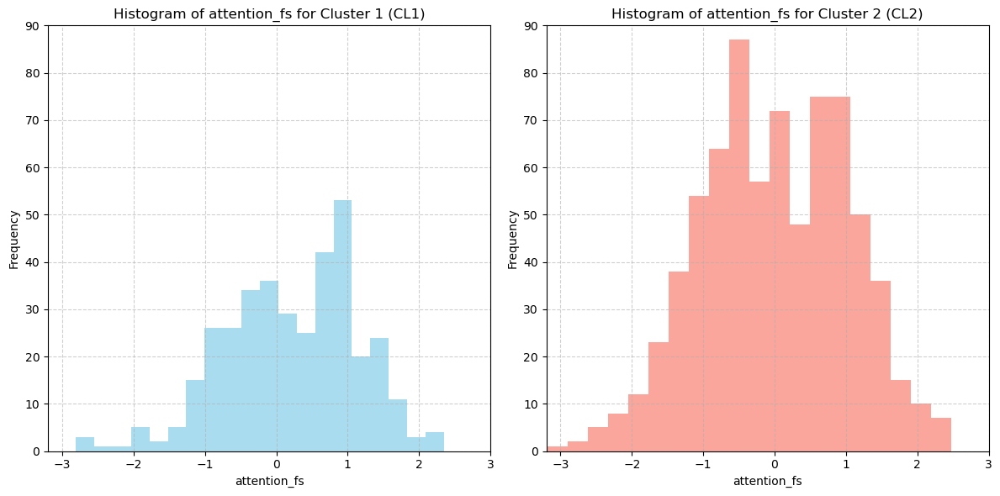

In [387]:
plt.figure(figsize=(12, 6))

# Histogram for "CL1" cluster
plt.subplot(1, 2, 1)
train[train['cluster_name'] == 'CL1']['attention_fs'].plot(kind='hist', bins=20, alpha=0.7, color='skyblue')
plt.title('Histogram of attention_fs for Cluster 1 (CL1)')
plt.xlabel('attention_fs')
plt.ylabel('Frequency')
plt.xlim(-3.2, 3)
plt.ylim(0, 90)
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid lines

# Histogram for "CL2" cluster
plt.subplot(1, 2, 2)
train[train['cluster_name'] == 'CL2']['attention_fs'].plot(kind='hist', bins=20, alpha=0.7, color='salmon')
plt.title('Histogram of attention_fs for Cluster 2 (CL2)')
plt.xlabel('attention_fs')
plt.ylabel('Frequency')
plt.xlim(-3.2, 3)
plt.ylim(0, 90)
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid lines

plt.tight_layout()
plt.show()

We observe that negative values are less frequent in both distributions, suggesting that individuals without attention deficit, hyperactivity, and impulsivity are less common in both Cluster 1 and Cluster 2 compared to those who exhibit these difficulties. Additionally, we note that while the mode in Cluster 1 is concentrated around the value of 1, in Cluster 2 it tends to fluctuate around 0.


### 5. Analysis of `age` by cluster


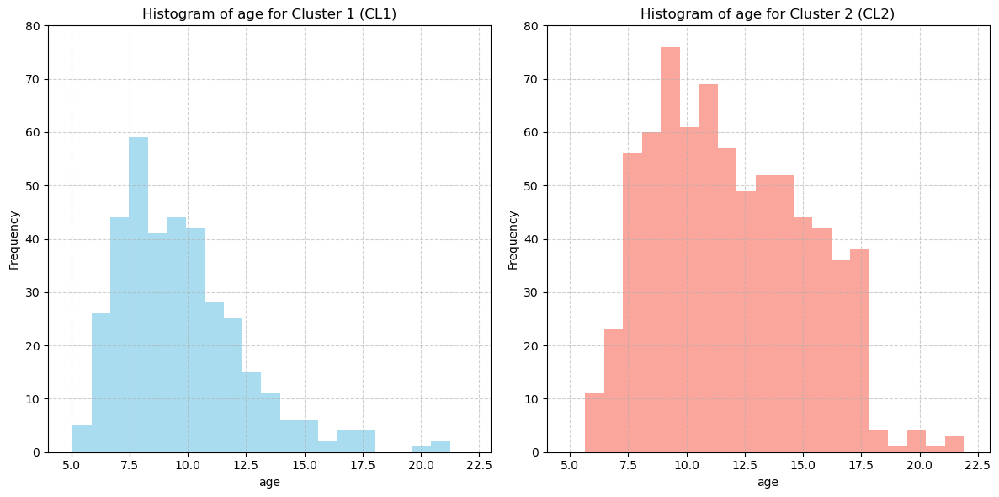

In [388]:
plt.figure(figsize=(12, 6))

# Histogram for "CL1" cluster
plt.subplot(1, 2, 1)
train[train['cluster_name'] == 'CL1']['age'].plot(kind='hist', bins=20, alpha=0.7, color='skyblue')
plt.title('Histogram of age for Cluster 1 (CL1)')
plt.xlabel('age')
plt.ylabel('Frequency')
plt.xlim(4, 23)
plt.ylim(0, 80)
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid lines


# Histogram for "CL2" cluster
plt.subplot(1, 2, 2)
train[train['cluster_name'] == 'CL2']['age'].plot(kind='hist', bins=20, alpha=0.7, color='salmon')
plt.title('Histogram of age for Cluster 2 (CL2)')
plt.xlabel('age')
plt.ylabel('Frequency')
plt.xlim(4, 23)
plt.ylim(0, 80)
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid lines


plt.tight_layout()
plt.show()

The distributions above highlight clear differences between the two clusters: in Cluster 1, the majority of individuals are between 7 and 11 years old, while in Cluster 2, most people are between 12 and 17 years old. This indicates that the average age is significantly higher in Cluster 2.

In [389]:
age_mean_by_cluster = train.groupby('cluster_name')['age'].mean()

print(age_mean_by_cluster)

cluster_name
CL1    9.7
CL2   11.9
Name: age, dtype: float64


### 6. Correlations between factors

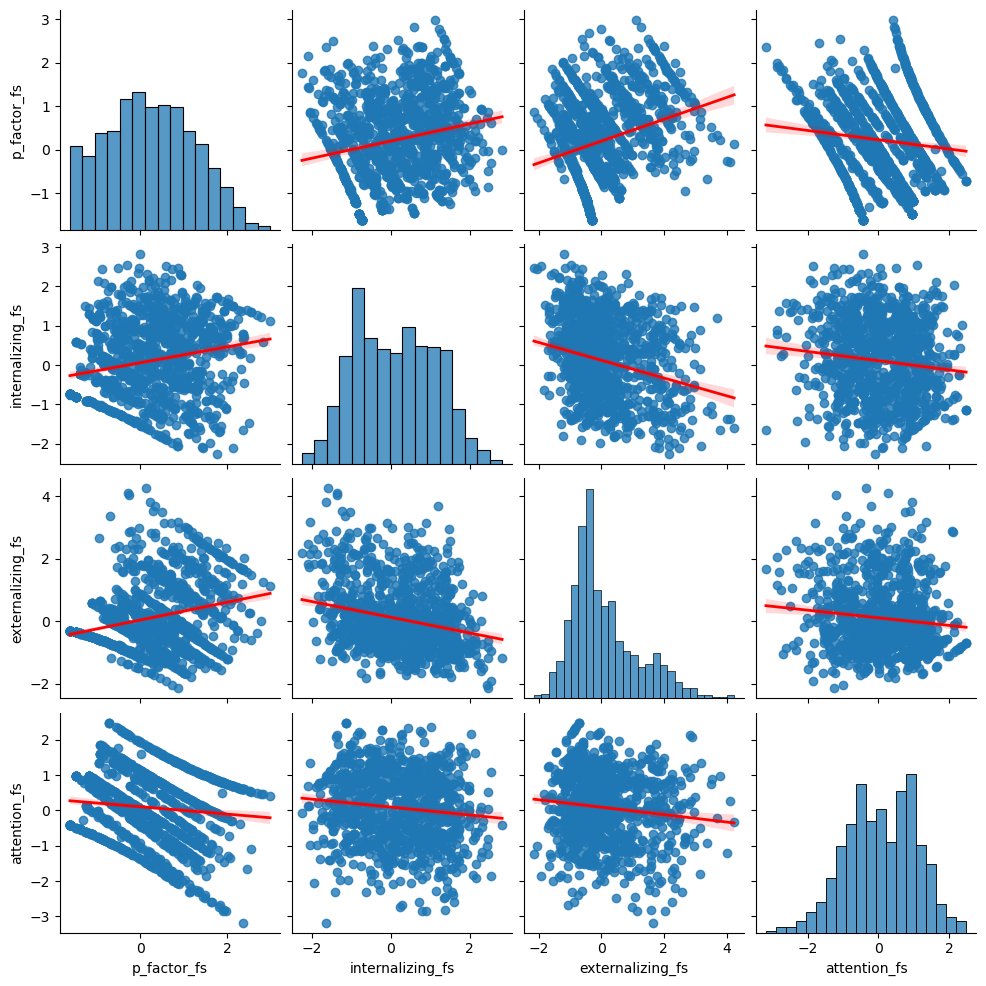

In [390]:
sns.pairplot(train[['p_factor_fs', 'internalizing_fs', 'externalizing_fs', 'attention_fs']], kind='reg', plot_kws={'line_kws': {'color': 'red', 'lw': 2}})

plt.show()

From the graph above, we observe that there are not many clearly defined trends, with the exceptions being the direct relationships between p_factor_fs and the variables internalizing_fs and externalizing_fs, as well as the inverse relationship with attention_fs. This suggests that as a person experiences a higher level of psychological problems, they also tend to have, to a lesser extent, a higher degree of internal dysfunction and externalized aggression. At the same time, individuals with lower attention levels tend to report fewer psychological issues.

                  p_factor_fs  internalizing_fs  externalizing_fs  \
p_factor_fs               1.0               0.2               0.3   
internalizing_fs          0.2               1.0              -0.2   
externalizing_fs          0.3              -0.2               1.0   
attention_fs             -0.1              -0.1              -0.1   
age                       0.0               0.1              -0.1   

                  attention_fs  age  
p_factor_fs               -0.1  0.0  
internalizing_fs          -0.1  0.1  
externalizing_fs          -0.1 -0.1  
attention_fs               1.0 -0.1  
age                       -0.1  1.0  


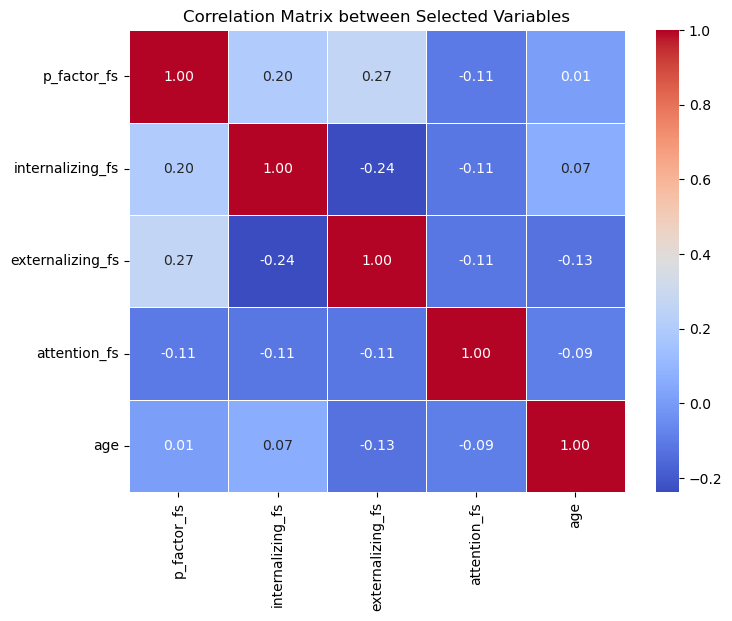

In [391]:
columns = ['p_factor_fs', 'internalizing_fs', 'externalizing_fs', 'attention_fs', 'age']
correlation_matrix = train[columns].corr()

print(correlation_matrix)

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix between Selected Variables')
plt.show()

From the correlation matrix presented above, we observe that the strongest correlation is between the general mental health factor and the factor reflecting aggressive behavior (0.27). This suggests that individuals facing generalized mental health difficulties may also exhibit more aggressive behavior.

Additionally, we found that the variable age shows the strongest correlation with externalizing_fs. The correlation is weak and negative, indicating an inverse relationship between the two variables. This could be interpreted as a tendency for emotional externalization to be more common in children and to decrease with age, becoming less characteristic of adolescents or adults.

Another noteworthy correlation is the weak negative relationship between internalizing_fs and externalizing_fs scores. This implies that individuals tend to express psychological problems either internally—through emotional dysfunctions—or externally—through aggressive behavior.

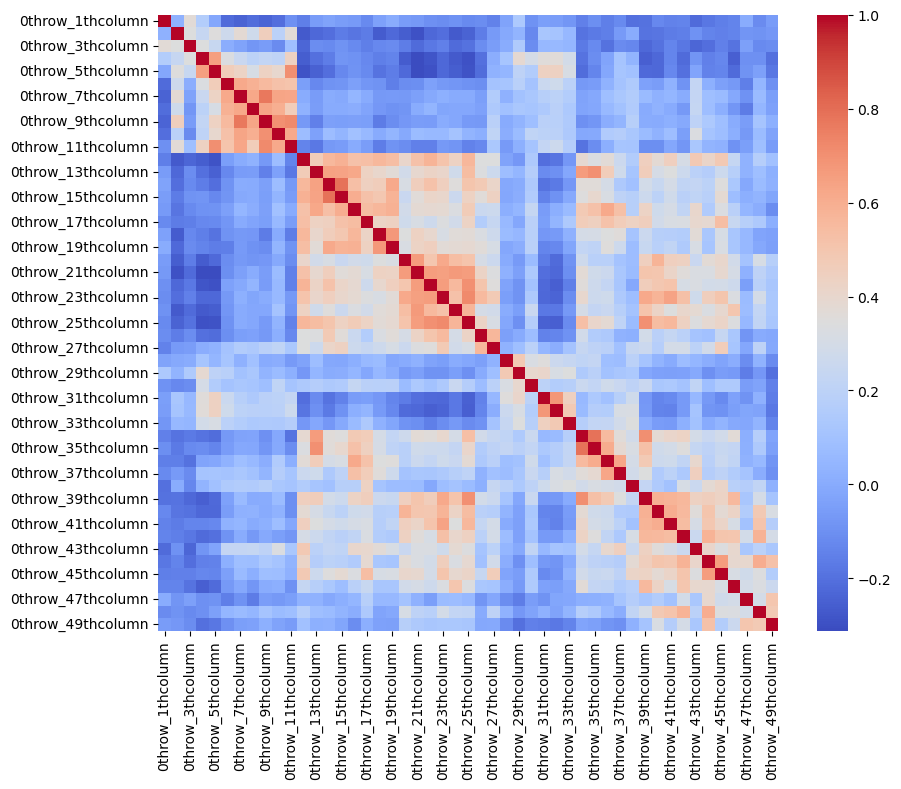

In [392]:
df_selected = train.iloc[:, 1:50]

plt.figure(figsize=(10, 8))  
sns.heatmap(df_selected.corr(), annot=False, cmap="coolwarm", cbar=True)

plt.show()

In the next step, we created a heat map for the first 50 variables extracted from the correlation matrices, aiming to visualize the correlations among them. We observe the presence of interconnected regions in the generated map, suggesting that correlated variables are associated with their proximity in brain structures. This implies that brain regions located near each other are more likely to be correlated in terms of their level of brain activity.

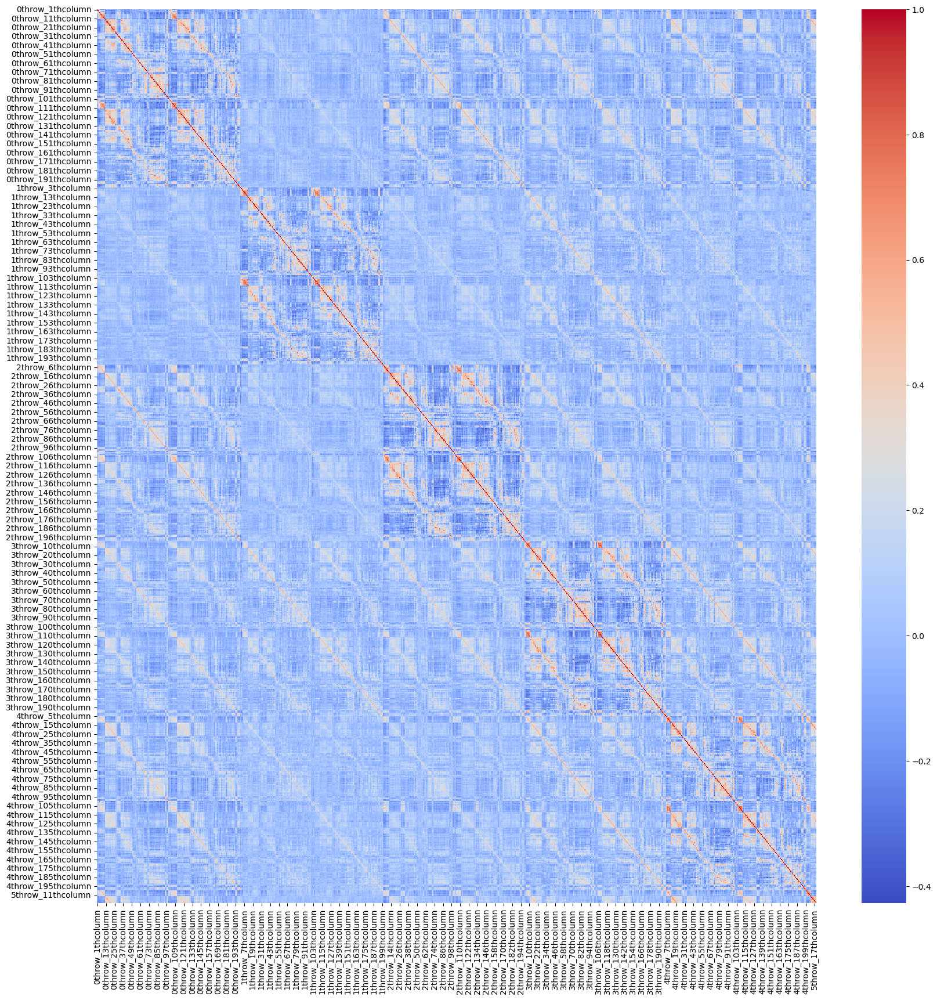

In [393]:
df_selected = train.iloc[:, 1:1000]  

plt.figure(figsize=(20, 20)) 
sns.heatmap(df_selected.corr(), annot=False, cmap="coolwarm", cbar=True)

plt.show()

In the graph above, we created a heat map for the first 1000 variables extracted from the correlation matrices, aiming to analyze whether the most correlated brain regions are those that are physically closest to each other in the human brain. We observe a series of "squares" representing correlations, as well as "squares within squares," indicating that correlations also exist between approximately neighboring regions. However, as brain areas become closer to one another, the correlations between them increase significantly. The closest regions exhibit correlations of approximately 0.6, suggesting a moderate and direct relationship between these brain areas.

Conclusions (Data Vis + Bonus):

1. The general factor of psychological problems shows a direct correlation with internal emotional dysfunctions and outward-oriented aggression, but an inverse correlation with attention deficit.

2. Brain regions located in close proximity tend to be more strongly correlated with each other.

3. Males and females display different psychological development trends as they age.

4. Cluster 2 includes the majority of individuals with more severe generalized psychological issues and pronounced emotional dysfunctions. This cluster also includes more adolescents compared to children.

5. Individuals tend to express their psychological difficulties either inwardly (emotional/internalizing) or outwardly through aggression (externalizing).

# V. Supervized Machine Learning for predicting the `age` variable

## Transforming categorial variables into numeric variables

Next, to be able to use all variables in our regression model, we will recode the variables starting with race.

The race variable will be transformed into 4 dummy variables: race_White, race_Black, race_Other, and race_Asian.

In [394]:
# Determine the full set of race categories
all_race_categories = ['White', 'Black', 'Asian', 'Other']

# Recode `race` in train_reduced
train_reduced = pd.get_dummies(train_reduced, columns=['race'], prefix='race', drop_first=False)
for col in [f'race_{cat}' for cat in all_race_categories if f'race_{cat}' not in train_reduced.columns]:
    train_reduced[col] = 0  # Add missing dummy columns as 0

# Recode `race` in test_reduced
test_reduced = pd.get_dummies(test_reduced, columns=['race'], prefix='race', drop_first=False)
for col in [f'race_{cat}' for cat in all_race_categories if f'race_{cat}' not in test_reduced.columns]:
    test_reduced[col] = 0  # Add missing dummy columns as 0

# Ensure both DataFrames have the same dummy variable structure
dummy_columns = [f'race_{cat}' for cat in all_race_categories]
train_reduced = train_reduced[dummy_columns + [col for col in train_reduced.columns if col not in dummy_columns]]
test_reduced = test_reduced[dummy_columns + [col for col in test_reduced.columns if col not in dummy_columns]]

# Convert boolean to integer (optional, as earlier)
train_reduced[dummy_columns] = train_reduced[dummy_columns].astype(int)
test_reduced[dummy_columns] = test_reduced[dummy_columns].astype(int)

# Check the structure
print("Train columns:", train_reduced.columns)
print("Test columns:", test_reduced.columns)

Train columns: Index(['race_White', 'race_Black', 'race_Asian', 'race_Other',
       'participant_id', 'age', 'sex', 'study_site', 'bmi', 'ethnicity',
       ...
       'PC103_11', 'PC103_12', 'PC103_13', 'PC103_14', 'PC103_15', 'sex_num',
       'race_0', 'race_1', 'race_2', 'race_3'],
      dtype='object', length=2959)
Test columns: Index(['race_White', 'race_Black', 'race_Asian', 'race_Other',
       'participant_id', 'sex', 'study_site', 'bmi', 'ethnicity', 'handedness',
       ...
       'PC103_7', 'PC103_8', 'PC103_9', 'PC103_10', 'PC103_11', 'PC103_12',
       'PC103_13', 'PC103_14', 'PC103_15', 'sex_num'],
      dtype='object', length=2953)


We will recode the ethnicity variable into ethnicity_num, where the value 0 is assigned to the response Not_Hispanic_or_Latino, and 1 is assigned to Hispanic_or_Latino.

Additionally, we have recoded parent_1_education and parent_2_education, assigning values from 0 to 3 progressively since these variables are ordinal.

In [395]:
# Ethnicity: Binary Encoding 
ethnicity_mapping = {'Not_Hispanic_or_Latino': 0, 'Hispanic_or_Latino': 1}
train_reduced['ethnicity_num'] = train_reduced['ethnicity'].map(ethnicity_mapping)
test_reduced['ethnicity_num'] = test_reduced['ethnicity'].map(ethnicity_mapping)

# Parent_1_education și Parent_2_education: Ordinal Encoding
education_mapping = {
    'No_incomplete primary': 0,
    'Complete_primary': 1,
    'Complete_secondary': 2,
    'Complete_tertiary': 3
}
train_reduced['parent_1_education_num'] = train_reduced['parent_1_education'].map(education_mapping)
train_reduced['parent_2_education_num'] = train_reduced['parent_2_education'].map(education_mapping)

test_reduced['parent_1_education_num'] = test_reduced['parent_1_education'].map(education_mapping)
test_reduced['parent_2_education_num'] = test_reduced['parent_2_education'].map(education_mapping)

print("Preview train_reduced:")
print(train_reduced.head())

print("\nPreview test_reduced:")
print(test_reduced.head())

Preview train_reduced:
   race_White  race_Black  race_Asian  race_Other participant_id  age     sex  \
0           0           0           0           0   NDARAA306NT2 21.2  Female   
1           0           0           0           0   NDARAA504CRN  9.2  Female   
2           0           0           0           0   NDARAA536PTU 12.0    Male   
3           0           0           0           0   NDARAB055BPR 10.8  Female   
4           0           0           0           0   NDARAB458VK9 12.8    Male   

   study_site  bmi               ethnicity  ...  PC103_14 PC103_15 sex_num  \
0           2 30.7  Not_Hispanic_or_Latino  ...       0.2      0.2       1   
1           0 16.5      Hispanic_or_Latino  ...      -0.0     -0.1       1   
2           3 21.3      Hispanic_or_Latino  ...       0.1      0.1       0   
3           2 26.9  Not_Hispanic_or_Latino  ...      -0.3      0.3       1   
4           0 15.8      Hispanic_or_Latino  ...       0.1      0.0       0   

   race_0  race_1  ra

We will convert the data type of the dummy variables from bool to int and check that the conversion was done correctly

In [396]:
# Convert specific boolean columns to integers
bool_columns = ['race_Black', 'race_Other', 'race_White','race_Asian']
train_reduced[bool_columns] = train_reduced[bool_columns].astype(int)
test_reduced[bool_columns] = test_reduced[bool_columns].astype(int)

In [397]:
train_reduced[bool_columns].dtypes

race_Black    int32
race_Other    int32
race_White    int32
race_Asian    int32
dtype: object

In [398]:
cols_to_convert = ['study_site', 'handedness']

train_reduced[cols_to_convert] = train_reduced[cols_to_convert].astype(str)
test_reduced[cols_to_convert] = test_reduced[cols_to_convert].astype(str)

In [399]:
print(train_reduced.dtypes[['study_site']])
print(test_reduced.dtypes[['study_site']])

study_site    object
dtype: object
study_site    object
dtype: object


In [400]:
print(train_reduced.dtypes[['handedness']])
print(test_reduced.dtypes[['handedness']])

handedness    object
dtype: object
handedness    object
dtype: object


As a final step in preparing the data for prediction, we split the train and test datasets by sex, resulting in four subsets: train_male, test_male, train_female, and test_female.

This approach was considered relevant due to significant differences between the brain structures of females and males. By segmenting the data, we aim to predict the age variable with the highest possible accuracy, tailoring the model to these specific characteristics.

In [401]:
# Split train_reduced
train_female = train_reduced[train_reduced['sex_num'] == 1]
train_male = train_reduced[train_reduced['sex_num'] == 0]

# Split test_reduced
test_female = test_reduced[test_reduced['sex_num'] == 1]
test_male = test_reduced[test_reduced['sex_num'] == 0]

# Verificarea dimensiunilor
print(f"Dimensiunea train_female: {train_female.shape}")
print(f"Dimensiunea train_male: {train_male.shape}")
print(f"Dimensiunea test_female: {test_female.shape}")
print(f"Dimensiunea test_male: {test_male.shape}")

Dimensiunea train_female: (416, 2962)
Dimensiunea train_male: (688, 2962)
Dimensiunea test_female: (179, 2956)
Dimensiunea test_male: (295, 2956)


## Ridge Regression

As a prediction model, we opted for Ridge regression, considering it the most suitable choice in this context. This type of regression is preferred when most features are relevant for predicting the target variable.

Additionally, Ridge regression tends to perform better on large datasets compared to Lasso regression, which is why we decided to use this method.

In [402]:
numeric_cols = train_male.select_dtypes(include=[np.number]).columns  # Select numeric columns

exclude_cols = ['sex_num', 'race_Asian','age']

# Exclude target variable and define predictors
X_train = train_male[numeric_cols].drop(columns=exclude_cols)
y_train = train_male['age']

# Define and fit Ridge Regression with Cross-Validation
ridge_model = RidgeCV(alphas=[0.1, 1.0, 10.0, 100.0], cv=5, scoring='neg_mean_absolute_error')
ridge_model.fit(X_train, y_train)

# Evaluate model on train data
train_preds = ridge_model.predict(X_train)

# Calculate MAE and RMSE
mae_train = mean_absolute_error(y_train, train_preds)
rmse_train = np.sqrt(mean_squared_error(y_train, train_preds))

print(f"MAE on Train Data: {mae_train:.2f}")
print(f"RMSE on Train Data: {rmse_train:.2f}")

MAE on Train Data: 0.89
RMSE on Train Data: 1.11


By splitting the train_male dataset into predictors stored in X_train (which includes all numerical variables except sex_num, race_Asian, and age) and the target variable age stored in Y_train, we achieved an RMSE (Root Mean Squared Error) of 1.12, indicating good model accuracy.

Below, we predicted the actual values for the age variable in test_male and saved the results alongside the patient IDs into a CSV file.

In [403]:
# Predict on test set
X_test = test_male[X_train.columns]
test_male['age_predicted'] = ridge_model.predict(X_test)

# Save predictions
test_male[['participant_id', 'age_predicted']].to_csv('test_male_predictions_ridge.csv', index=False)
print("Predicțiile au fost salvate în 'test_male_predictions_ridge.csv'.")

Predicțiile au fost salvate în 'test_male_predictions_ridge.csv'.


C:\Users\Francisca\AppData\Local\Temp\ipykernel_13520\2110345664.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_male['age_predicted'] = ridge_model.predict(X_test)


In [404]:
# Retrieve feature coefficients
coefficients = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': ridge_model.coef_
}).sort_values(by='Coefficient', ascending=False)

print(coefficients.head(10))  # Top 10 positive features
print(coefficients.tail(10))  # Top 10 negative features

       Feature  Coefficient
1062    PC54_3          0.2
3          bmi          0.2
2721  PC149_15          0.2
2022   PC64_15          0.2
585    PC123_6          0.2
874    PC187_5          0.1
1677     PC9_2          0.1
1342     PC1_5          0.1
2268    PC53_8          0.1
2415    PC17_1          0.1
                     Feature  Coefficient
2793                PC159_14         -0.1
2371                 PC172_2         -0.1
2325                 PC155_2         -0.1
1052                 PC24_11         -0.1
1076                  PC48_1         -0.1
518                  PC154_1         -0.1
2946  parent_2_education_num         -0.2
6           externalizing_fs         -0.2
1833                 PC179_1         -0.2
554                   PC52_7         -0.2


We applied the same method to the train_female dataset as well.

In [405]:
# Exclude target variable and define predictors
X_train = train_female[numeric_cols].drop(columns=exclude_cols)
y_train = train_female['age']

# Define and fit Ridge Regression with Cross-Validation
ridge_model = RidgeCV(alphas=[0.1, 1.0, 10.0, 100.0], cv=5, scoring='neg_mean_absolute_error')
ridge_model.fit(X_train, y_train)

# Evaluate model on train data
train_preds = ridge_model.predict(X_train)

# Calculate MAE and RMSE
mae_train = mean_absolute_error(y_train, train_preds)
rmse_train = np.sqrt(mean_squared_error(y_train, train_preds))

print(f"MAE on Train Data: {mae_train:.2f}")
print(f"RMSE on Train Data: {rmse_train:.2f}")

MAE on Train Data: 0.91
RMSE on Train Data: 1.16


We observe that the RMSE for the train_female dataset is slightly higher, which is expected given that the female sample size is smaller than that of the males.

In [406]:
# Predict on test set
X_test = test_female[X_train.columns]
test_female['age_predicted'] = ridge_model.predict(X_test)

# Save predictions
test_female[['participant_id', 'age_predicted']].to_csv('test_female_predictions_ridge.csv', index=False)
print("Predicțiile au fost salvate în 'test_female_predictions_ridge.csv'.")

Predicțiile au fost salvate în 'test_female_predictions_ridge.csv'.


C:\Users\Francisca\AppData\Local\Temp\ipykernel_13520\1432311629.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_female['age_predicted'] = ridge_model.predict(X_test)


In [407]:
# Retrieve feature coefficients
coefficients = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': ridge_model.coef_
}).sort_values(by='Coefficient', ascending=False)

print(coefficients.head(10))  # Top 10 positive features
print(coefficients.tail(10))  # Top 10 negative features

               Feature  Coefficient
199            PC153_5          0.2
3                  bmi          0.2
2232            PC95_2          0.2
2054            PC20_1          0.2
5     internalizing_fs          0.2
2008            PC64_1          0.1
1469             PC8_2          0.1
1188            PC29_1          0.1
904             PC94_4          0.1
1496          PC203_11          0.1
           Feature  Coefficient
267        PC67_11         -0.1
1067        PC54_8         -0.1
2918        PC93_6         -0.1
1777       PC273_3         -0.1
1651        PC2_11         -0.1
2871       PC190_1         -0.1
1789       PC146_1         -0.1
552         PC52_5         -0.1
7     attention_fs         -0.2
1660        PC31_2         -0.2


## XGBoost

As a final model, we will predict age using the original datasets, split into four subsets based on sex.

The datasets used at this stage include the original variables derived from the patients' correlation matrices and do not contain principal components.

In [408]:
train_female_xgb = train[train['sex'] == 'Female']
test_female_xgb = test[test['sex'] == 'Female']

train_male_xgb = train[train['sex'] == 'Male']
test_male_xgb = test[test['sex'] == 'Male']

print(f"Dimensiunea train_female_xgb: {train_female_xgb.shape}")
print(f"Dimensiunea test_female_xgb: {test_female_xgb.shape}")
print(f"Dimensiunea train_male_xgb: {train_male_xgb.shape}")
print(f"Dimensiunea test_male_xgb: {test_male_xgb.shape}")

Dimensiunea train_female_xgb: (416, 19917)
Dimensiunea test_female_xgb: (179, 19913)
Dimensiunea train_male_xgb: (688, 19917)
Dimensiunea test_male_xgb: (295, 19913)


The code below selects the top 500 most relevant numerical variables derived from the correlation matrices based on their relationship with the age variable in the train_male_xgb dataset.

In [409]:
# Select only the most informative variables with respect to AGE
brain_variables = [col for col in train_male_xgb.columns if 'throw' in col]
X = train_male_xgb[brain_variables]
y = train_male_xgb['age']

# Select the top 500 variables based on their relevance to Age
selector = SelectKBest(score_func=f_regression, k=500)
X_reduced = selector.fit_transform(X, y)

# Get the names of the selected variables
selected_features = X.columns[selector.get_support()]
print(f"Number of selected variables: {len(selected_features)}")

Number of selected variables: 500


Below, we used the XGBRegressor regression model to predict the age variable based on the 500 selected variables previously stored in X_reduced.

Initially, the dataset is split into two subsets—one for training (X_train and y_train) and one for testing (X_test and y_test)—using the train_test_split function, with 20% of the data allocated for testing.

After training, the model is used to generate predictions (y_pred) on the testing subset (X_test). The model’s performance is evaluated using the Mean Squared Error (MSE), which we observe to be equal to 7.456.

In [410]:
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_reduced, y, test_size=0.2, random_state=42)

# Train an XGBoost model
model = XGBRegressor(n_estimators=100, max_depth=5, random_state=42)
model.fit(X_train, y_train)

# Predictions and evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

Mean Squared Error: 7.950023942559465


Below is a plot illustrating the importance of each of the 500 variables used in the trained model. It can be observed that only a relatively small number of variables have a significant impact on the model’s predictions.

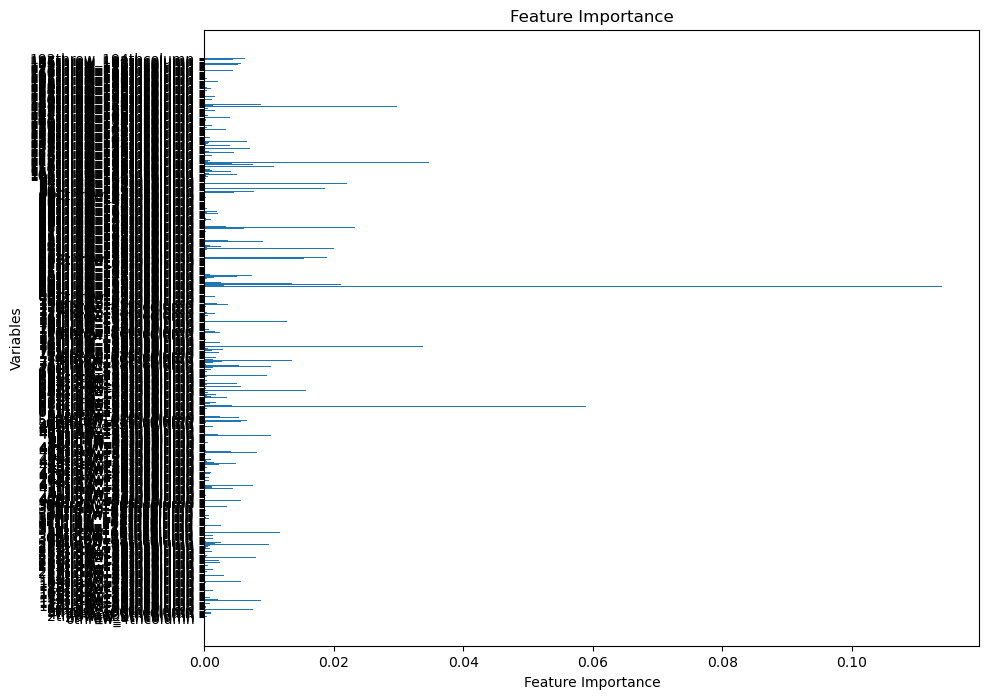

In [411]:
# Feature importance
feature_importances = model.feature_importances_

# Visualization
plt.figure(figsize=(10, 8))
plt.barh(selected_features, feature_importances)
plt.xlabel("Feature Importance")
plt.ylabel("Variables")
plt.title("Feature Importance")
plt.show()

Below, we applied the previously trained model to the train_male_xgb dataset and saved the predicted age for each patient, along with the patient's ID, into a CSV file.

In [412]:
# Select the variables from test_male_xgb that correspond to the 500 selected features
test_brain_variables = [col for col in test_male_xgb.columns if 'throw' in col]
X_test_male = test_male_xgb[test_brain_variables]

# Apply the SelectKBest transformation used during training
X_test_male_reduced = selector.transform(X_test_male)

# Ensure that test_male_xgb has the same variables as those selected in train
X_test_male_reduced = pd.DataFrame(X_test_male_reduced, columns=selected_features, index=test_male_xgb.index)

# Make predictions on test_male_xgb using the trained model
test_male_xgb['age_predicted'] = model.predict(X_test_male_reduced)

# Save the results to a CSV file
test_male_xgb[['participant_id', 'age_predicted']].to_csv('test_male_xgb_predictions.csv', index=False)

C:\Users\Francisca\AppData\Local\Temp\ipykernel_13520\1324528244.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_male_xgb['age_predicted'] = model.predict(X_test_male_reduced)


We will aply the same method to the train_female data frame

In [413]:
# Select only the most informative variables with respect to AGE
brain_variables = [col for col in train_female_xgb.columns if 'throw' in col]
X = train_female_xgb[brain_variables]
y = train_female_xgb['age']

# Select the top 500 variables based on their relevance to Age
selector = SelectKBest(score_func=f_regression, k=500)
X_reduced = selector.fit_transform(X, y)

# Get the names of the selected variables
selected_features = X.columns[selector.get_support()]
print(f"Number of selected variables: {len(selected_features)}")

Number of selected variables: 500


In [414]:
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_reduced, y, test_size=0.2, random_state=42)

# Train an XGBoost model
model = XGBRegressor(n_estimators=100, max_depth=5, random_state=42)
model.fit(X_train, y_train)

# Predictions and evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

Mean Squared Error: 8.781440521668774


We have observed that the Mean Squared Error is higher for the training dataset in the case of females, which is expected given that the female sample size is smaller than that of the males.

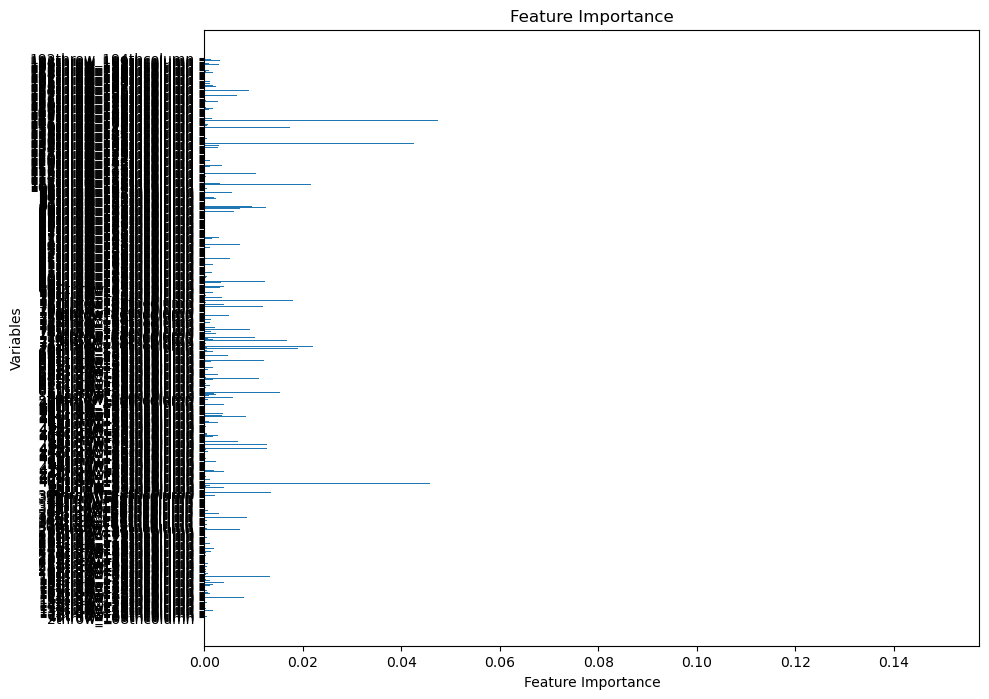

In [415]:
# Feature importance
feature_importances = model.feature_importances_

# Visualization
plt.figure(figsize=(10, 8))
plt.barh(selected_features, feature_importances)
plt.xlabel("Feature Importance")
plt.ylabel("Variables")
plt.title("Feature Importance")
plt.show()

In [416]:
# Select the variables from test_female_xgb that correspond to the 500 selected features
test_brain_variables = [col for col in test_female_xgb.columns if 'throw' in col]
X_test_female = test_female_xgb[test_brain_variables]

# Apply the SelectKBest transformation used during training
X_test_female_reduced = selector.transform(X_test_female)

# Ensure that test_female_xgb has the same variables as those selected in train
X_test_female_reduced = pd.DataFrame(X_test_female_reduced, columns=selected_features, index=test_female_xgb.index)

# Make predictions on test_female_xgb using the trained model
test_female_xgb['age_predicted'] = model.predict(X_test_female_reduced)

# Save the results to a CSV file
test_female_xgb[['participant_id', 'age_predicted']].to_csv('test_female_xgb_predictions.csv', index=False)

C:\Users\Francisca\AppData\Local\Temp\ipykernel_13520\549576646.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_female_xgb['age_predicted'] = model.predict(X_test_female_reduced)


### Authors:

Vargă Francisca Maria

Vlad Dragoș-Ionuț